In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.stats import SigmaClip
from photutils import Background2D, SExtractorBackground
from pipeline import *
from utils import *


## 1. Background Subtraction

In [2]:
Raw_Datacube = Read_Raw_Datacube("/home/qliu/data/2307027p.fits",name="A2465C")
Raw_Datacube.header

SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                  -32 / array data type                                
NAXIS   =                    3 / number of array dimensions                     
NAXIS1  =                 2048                                                  
NAXIS2  =                 2064                                                  
NAXIS3  =                  207                                                  
EXTEND  =                    T                                                  
DATE    = '2019-01-29'         / Creation date                                  
MASK    = 'False   '                                                            
FILETYPE= 'Calibrated Spectrum Cube' / Type of file                             
OBSERVAT= 'CFHT    '           / Observatory name                               
TELESCOP= 'CFHT 3.6m'          / Hawaii Big Island, Mauna Kea                   
INSTRUME= 'SITELLE '        

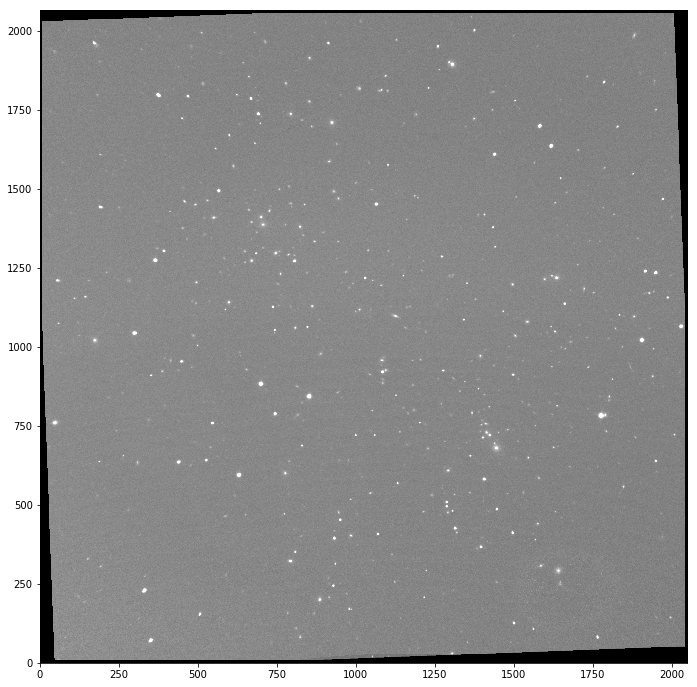

In [3]:
Raw_Datacube.display(Raw_Datacube.raw_stack_field)

In [4]:
Raw_Datacube.save_mask_edge(save_path='/home/qliu/data/')

In [5]:
Raw_Datacube.remove_background(save_path='./A2465C/fig/bkg/', plot=False)

Removing background...Frame: 10
Removing background...Frame: 20
Removing background...Frame: 30
Removing background...Frame: 40
Removing background...Frame: 50
Removing background...Frame: 60
Removing background...Frame: 70
Removing background...Frame: 80
Removing background...Frame: 90


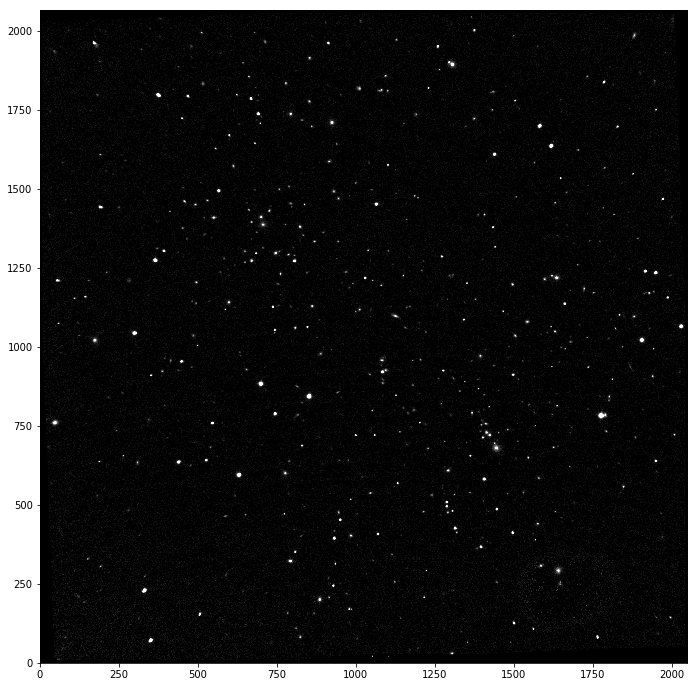

In [6]:
Raw_Datacube.display(Raw_Datacube.stack_field)

In [7]:
Raw_Datacube.remove_fringe(skip_frames=range(20,75), save_path='./A2465C/fig/bkg/', plot=False)

Removing fringe...Frame: 10
Removing fringe...Frame: 20
Removing fringe...Frame: 30
Removing fringe...Frame: 40
Removing fringe...Frame: 50
Removing fringe...Frame: 60
Removing fringe...Frame: 70
Removing fringe...Frame: 80
Removing fringe...Frame: 90


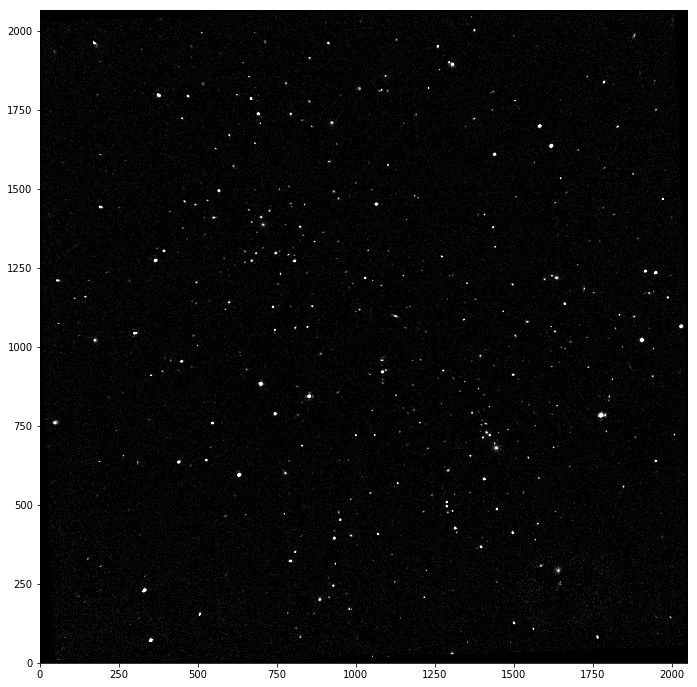

In [12]:
Raw_Datacube.display(Raw_Datacube.stack_field)

In [26]:
Raw_Datacube.save_fits(save_path='/home/qliu/data/')

Saving background & fringe subtracted datacube and stacked field...


In [ ]:
# Weightmap for SE if mask is needed
Raw_Datacube.save_weight_map("/home/qliu/Desktop/Cluster/A2465C/A2465C.reg", weight=0.01, 
                save_path = '/home/qliu/Desktop/Cluster/A2465C')
Raw_Datacube.display(Raw_Datacube.mymask,vmax=None)

## 2. Seeing Calculation

In [30]:
Datacube = Read_Datacube("/home/qliu/data/A2465C_cube.fits",z0=0.245,name="A2465C",
                         SE_catalog="./A2465C/SE/A2465C_run1.cat")

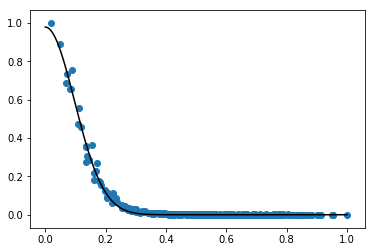

1.0775073385635616


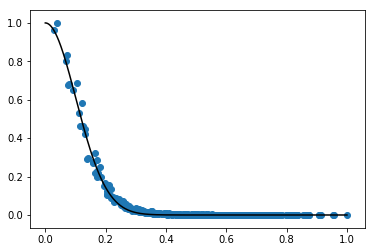

1.1703704519429072


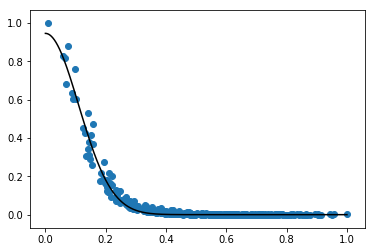

1.2439356965168409


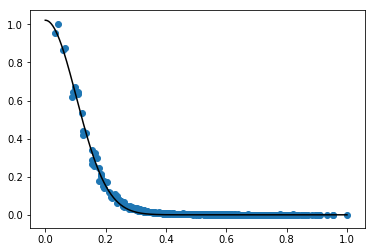

1.1455492458277479


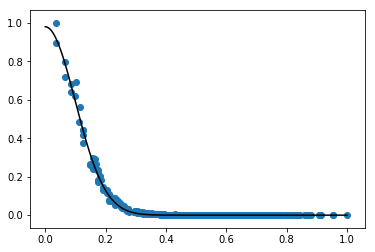

1.134539465449362


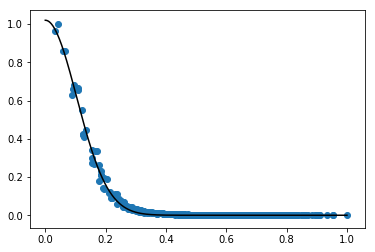

1.158770295012295


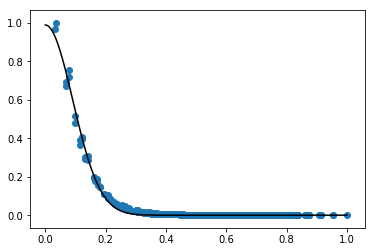

1.042971688754049


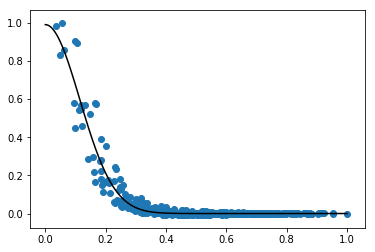

1.2644914600772412


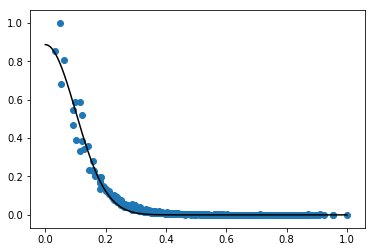

1.1361256112926845


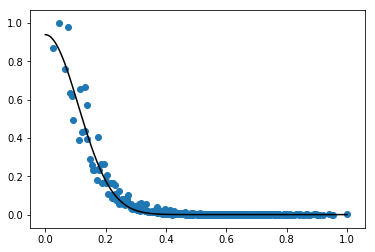

1.2015010864938465


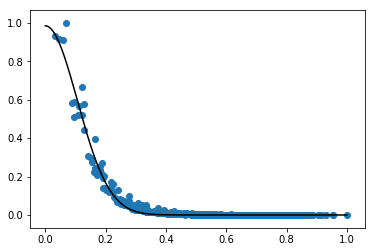

1.1740183675320208


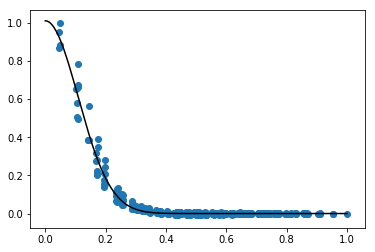

1.2256268154474397


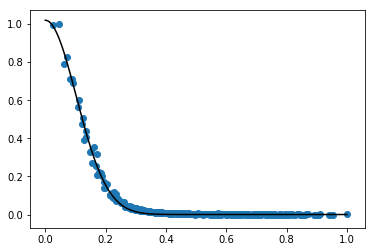

1.1478087620833495


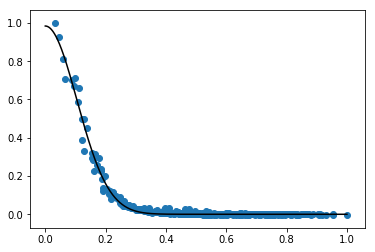

1.1610016778397203


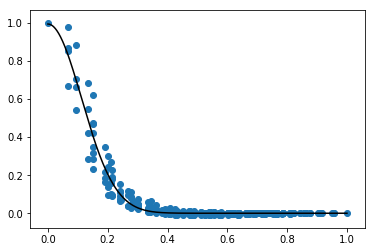

1.2698154281329086


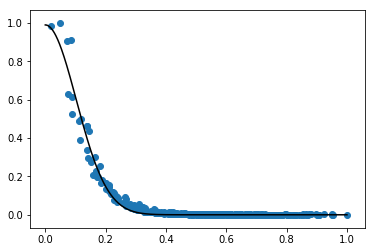

1.1165808199883993
Median seeing FWHM in arcsec: 1.160


In [31]:
Datacube.calculate_seeing(mag_cut=0.3, plot=True)

## 3. Spectra Extraction

In [45]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.table import Table
from astropy.stats import mad_std, SigmaClip
from utils import *
from pipeline import *

In [33]:
Datacube = Read_Datacube("/home/qliu/data/A2465C_cube.fits",z0=0.245, name="A2465C",
                         SE_catalog="./A2465C/SE/A2465C_run2.cat")
Datacube.read_mask('/home/qliu/data/Raw_stack_A2465C_mask.fits')
Datacube.read_seg('./A2465C/SE/segment_run2.fits')

Optimal Aperture: 1.4 Rp, SNR = 20.4023


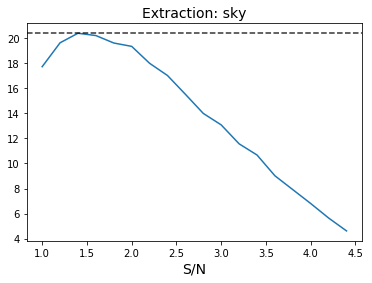

Optimal Aperture: 2.2 Rp, SNR = 7.7734


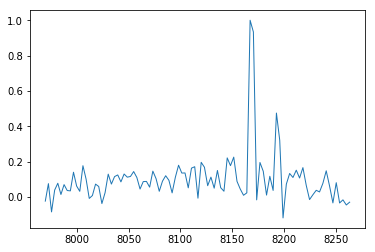

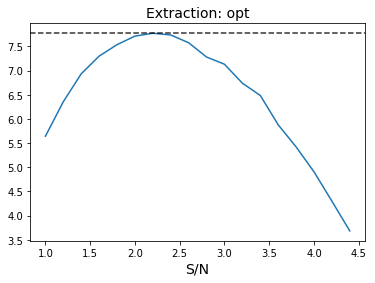

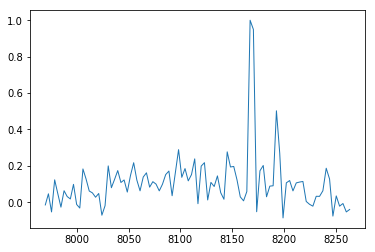

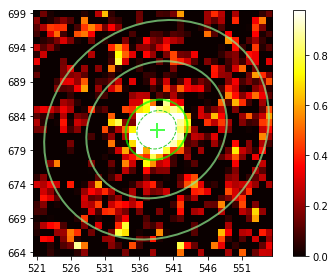

In [42]:
spec_sky, k_sky, snr_sky, apers_sky = Datacube.spec_extraction(num=400, ext_type='sky', k1=5., k2=8, 
                                                     print_out=True, plot=True, display=False)
spec_opt, k_opt, snr_opt, apers_opt = Datacube.spec_extraction(num=400, ext_type='opt', k1=5., k2=8,
                                                    print_out=True, plot=True, display=True)
apers_sky[0].plot(color='limegreen',ls='--')
plt.show()

In [43]:
Datacube.spec_extraction_all(ks = np.arange(1.,4.6,0.1), k1=5., k2=8.,save_path='./A2465C/fig/img_thumb/')

#1 spectra extracted
#2 spectra extracted
#3 spectra extracted
#4 spectra extracted
#5 spectra extracted
#6 spectra extracted
#7 spectra extracted
#8 spectra extracted
#9 spectra extracted
#10 spectra extracted
#11 spectra extracted
#12 spectra extracted
#13 spectra extracted
#14 spectra extracted
#15 spectra extracted
#16 spectra extracted
#17 spectra extracted
#18 spectra extracted
#19 spectra extracted
#20 spectra extracted
#21 spectra extracted
#22 spectra extracted
#23 spectra extracted
#24 spectra extracted
#25 spectra extracted
#26 spectra extracted
#27 spectra extracted
#28 spectra extracted
#29 spectra extracted
#30 spectra extracted
#31 spectra extracted
#32 spectra extracted
#33 spectra extracted
#34 spectra extracted
#35 spectra extracted
#36 spectra extracted
#37 spectra extracted
#38 spectra extracted
#39 spectra extracted
#40 spectra extracted
#41 spectra extracted
#42 spectra extracted
#43 spectra extracted
#44 spectra extracted
#45 spectra extracted
#46 spectra extract

#362 spectra extracted
#363 spectra extracted
#364 spectra extracted
#365 spectra extracted
#366 spectra extracted
#367 spectra extracted
#368 spectra extracted
#369 spectra extracted
#370 spectra extracted
#371 spectra extracted
#372 spectra extracted
#373 spectra extracted
#374 spectra extracted
#375 spectra extracted
#376 spectra extracted
#377 spectra extracted
#378 spectra extracted
#379 spectra extracted
#380 spectra extracted
#381 spectra extracted
#382 spectra extracted
#383 spectra extracted
#384 spectra extracted
#385 spectra extracted
#386 spectra extracted
#387 spectra extracted
#388 spectra extracted
#389 spectra extracted
#390 spectra extracted
#391 spectra extracted
#392 spectra extracted
#393 spectra extracted
#394 spectra extracted
#395 spectra extracted
#396 spectra extracted
#397 spectra extracted
#398 spectra extracted
#399 spectra extracted
#400 spectra extracted
#401 spectra extracted
#402 spectra extracted
#403 spectra extracted
#404 spectra extracted
#405 spectr

#719 spectra extracted
#720 spectra extracted
#721 spectra extracted
#722 spectra extracted
#723 spectra extracted
#724 spectra extracted
#725 spectra extracted
#726 spectra extracted
#727 spectra extracted
#728 spectra extracted
#729 spectra extracted
#730 spectra extracted
#731 spectra extracted
#732 spectra extracted
#733 spectra extracted
#734 spectra extracted
#735 spectra extracted
#736 spectra extracted
#737 spectra extracted
#738 spectra extracted
#739 spectra extracted
#740 spectra extracted
#741 spectra extracted
#742 spectra extracted
#743 spectra extracted
#744 spectra extracted
#745 spectra extracted
#746 spectra extracted
#747 spectra extracted
#748 spectra extracted
#749 spectra extracted
#750 spectra extracted
#751 spectra extracted
#752 spectra extracted
#753 spectra extracted
#754 spectra extracted
#755 spectra extracted
#756 spectra extracted
#757 spectra extracted
#758 spectra extracted
#759 spectra extracted
#760 spectra extracted
#761 spectra extracted
#762 spectr

#1073 spectra extracted
#1074 spectra extracted
#1075 spectra extracted
#1076 spectra extracted
#1077 spectra extracted
#1078 spectra extracted
#1079 spectra extracted
#1080 spectra extracted
#1081 spectra extracted
#1082 spectra extracted
#1083 spectra extracted
#1084 spectra extracted
#1085 spectra extracted
#1086 spectra extracted
#1087 spectra extracted
#1088 spectra extracted
#1089 spectra extracted
#1090 spectra extracted
#1091 spectra extracted
#1092 spectra extracted
#1093 spectra extracted
#1094 spectra extracted
#1095 spectra extracted
#1096 spectra extracted
#1097 spectra extracted
#1098 spectra extracted
#1099 spectra extracted
#1100 spectra extracted
#1101 spectra extracted
#1102 spectra extracted
#1103 spectra extracted
#1104 spectra extracted
#1105 spectra extracted
#1106 spectra extracted
#1107 spectra extracted
#1108 spectra extracted
#1109 spectra extracted
#1110 spectra extracted
#1111 spectra extracted
#1112 spectra extracted
#1113 spectra extracted
#1114 spectra ex

In [44]:
Datacube.save_spec_plot(save_path='./A2465C/fig/spec/')
Datacube.save_spec_fits(save_path='./A2465C/', suffix="")

## 4. Cross-correlation

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from utils import *
from pipeline import *

Datacube = Read_Datacube("/home/qliu/data/A2465C_cube.fits", z0=0.245, name="A2465C", SE_catalog="./A2465C/SE/A2465C_run2.cat")
Datacube.read_mask('/home/qliu/data/Raw_stack_A2465C_mask.fits')
Datacube.read_seg('./A2465C/SE/segment_run2.fits')
Datacube.read_spec('./A2465C/A2465C-spec.fits')

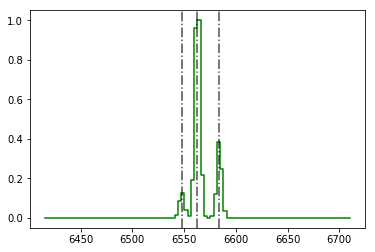

(200, 95)

In [4]:
# Gaussian Template
Datacube.generate_template(number=200, width=3, model='gaussian')
Datacube.temps.shape

SE Objects #1071   S/N med: 5.23  max: 5.5


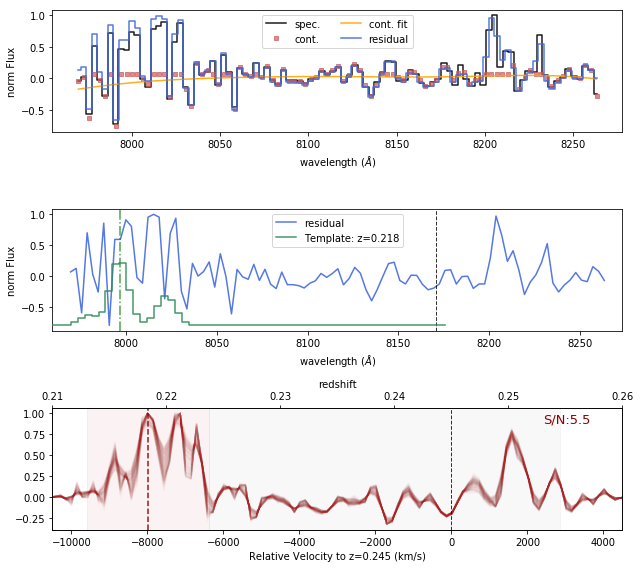

In [3]:
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(1071, ext_type='opt')

SE Objects #13   S/N med: 5.23  max: 5.46


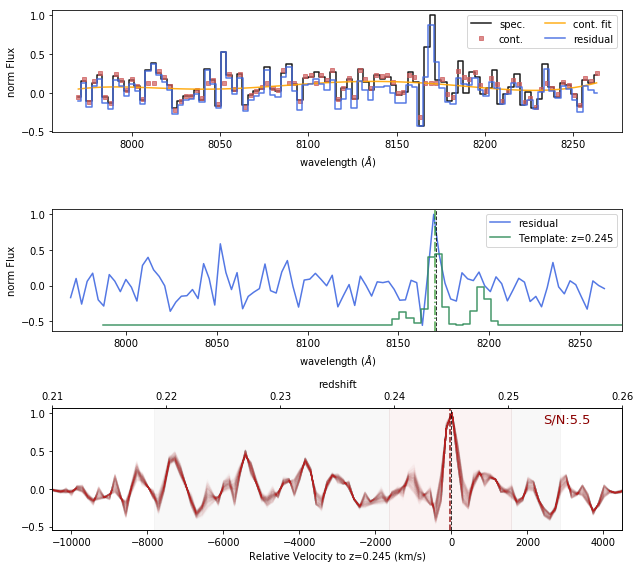

In [4]:
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(13, ext_type='opt')

SE Objects #839   S/N med: 3.66  max: 4.31
SE Objects #839   S/N med: 6.29  max: 7.02


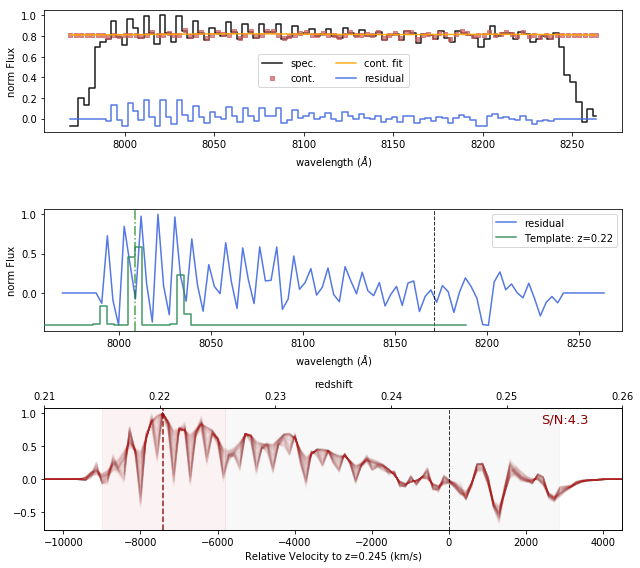

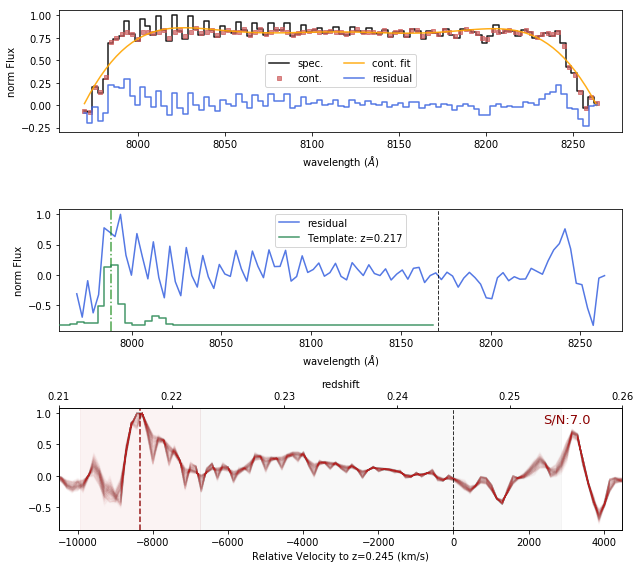

In [5]:
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(839, ext_type='opt')
ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(839, edge_ratio=0.15, ext_type='opt')

In [6]:
Datacube.cross_correlation_all(ext_type='opt')

SE Objects #1   S/N med: 2.3  max: 2.89
SE Objects #2   S/N med: 3.66  max: 4.36
SE Objects #3   S/N med: 5.96  max: 7.26
SE Objects #4   S/N med: 4.74  max: 5.54
SE Objects #5   S/N med: 3.07  max: 3.7
SE Objects #6   S/N med: 1.01  max: 1.19
SE Objects #7   S/N med: 2.2  max: 2.64
SE Objects #8   S/N med: 2.59  max: 3.26
SE Objects #9   S/N med: 3.17  max: 3.29
SE Objects #10   S/N med: 2.44  max: 2.9
SE Objects #11   S/N med: 3.5  max: 3.75
SE Objects #12   S/N med: 1.31  max: 1.46
SE Objects #13   S/N med: 5.23  max: 5.46
SE Objects #14   S/N med: 2.3  max: 2.52
SE Objects #15   S/N med: 10.3  max: 10.6
SE Objects #16   S/N med: 4.21  max: 4.66
SE Objects #17   S/N med: 3.58  max: 3.95
SE Objects #18   S/N med: 3.64  max: 4.14
SE Objects #19   S/N med: 2.86  max: 3.34
SE Objects #20   S/N med: 2.33  max: 2.5
SE Objects #21   S/N med: 3.22  max: 3.36
SE Objects #22   S/N med: 3.1  max: 3.69
SE Objects #23   S/N med: 4.17  max: 4.46
SE Objects #24   S/N med: 2  max: 2.31
SE Objects #

SE Objects #198   S/N med: 3.27  max: 3.54
SE Objects #199   S/N med: 2.8  max: 3.34
SE Objects #200   S/N med: 2.51  max: 2.91
SE Objects #201   S/N med: 2.12  max: 2.34
SE Objects #202   S/N med: 3.17  max: 3.86
SE Objects #203   S/N med: 2.56  max: 2.81
SE Objects #204   S/N med: 3.65  max: 3.8
SE Objects #205   S/N med: 2.45  max: 2.6
SE Objects #206   S/N med: 3.34  max: 4.16
SE Objects #207   S/N med: 4.22  max: 4.37
SE Objects #208   S/N med: 2.83  max: 3.59
SE Objects #209   S/N med: 4  max: 4.64
SE Objects #210   S/N med: 3.93  max: 4.4
SE Objects #211   S/N med: 2.63  max: 3.42
SE Objects #212   S/N med: 4.05  max: 4.33
SE Objects #213   S/N med: 2.06  max: 2.55
SE Objects #214   S/N med: 2.26  max: 2.55
SE Objects #215   S/N med: 2.96  max: 3.44
SE Objects #216   S/N med: 19.7  max: 21.5
SE Objects #217   S/N med: 3.23  max: 3.54
SE Objects #218   S/N med: 2.87  max: 3.2
SE Objects #219   S/N med: 3.18  max: 3.27
SE Objects #220   S/N med: 2.03  max: 2.32
SE Objects #221   S

SE Objects #391   S/N med: 2.59  max: 2.81
SE Objects #392   S/N med: 2.64  max: 2.9
SE Objects #393   S/N med: 4.25  max: 4.37
SE Objects #394   S/N med: 1.31  max: 1.7
SE Objects #395   S/N med: 2.71  max: 3.3
SE Objects #396   S/N med: 4.26  max: 4.67
SE Objects #397   S/N med: 1.96  max: 3.22
SE Objects #398   S/N med: 2.82  max: 3.04
SE Objects #399   S/N med: 2.45  max: 2.56
SE Objects #400   S/N med: 16.3  max: 16.6
SE Objects #401   S/N med: 2.75  max: 2.87
SE Objects #402   S/N med: 2.19  max: 2.27
SE Objects #403   S/N med: 3.18  max: 3.48
SE Objects #404   S/N med: 2.93  max: 3.29
SE Objects #405   S/N med: 3.22  max: 3.49
SE Objects #406   S/N med: 4.34  max: 4.73
SE Objects #407   S/N med: 3.29  max: 3.77
SE Objects #408   S/N med: 4.13  max: 4.38
SE Objects #409   S/N med: 3.99  max: 4.2
SE Objects #410   S/N med: 4.46  max: 5.74
SE Objects #411   S/N med: 3.06  max: 3.48
SE Objects #412   S/N med: 2.61  max: 3.19
SE Objects #413   S/N med: 2.05  max: 2.88
SE Objects #414

SE Objects #583   S/N med: 3.47  max: 3.87
SE Objects #584   S/N med: 4.17  max: 4.35
SE Objects #585   S/N med: 4.22  max: 4.59
SE Objects #586   S/N med: 2.8  max: 2.9
SE Objects #587   S/N med: 2.65  max: 3.23
SE Objects #588   S/N med: 5.34  max: 5.75
SE Objects #589   S/N med: 5.31  max: 5.73
SE Objects #590   S/N med: 2.58  max: 2.86
SE Objects #591   S/N med: 2.84  max: 2.99
SE Objects #592   S/N med: 2.81  max: 3.16
SE Objects #593   S/N med: 3.09  max: 3.63
SE Objects #594   S/N med: 3.18  max: 3.68
SE Objects #595   S/N med: 4.07  max: 4.92
SE Objects #596   S/N med: 2.8  max: 3.31
SE Objects #597   S/N med: 2.43  max: 2.67
SE Objects #598   S/N med: 3.28  max: 3.87
SE Objects #599   S/N med: 3.23  max: 4.01
SE Objects #600   S/N med: 2.39  max: 2.9
SE Objects #601   S/N med: 7.08  max: 9.46
SE Objects #602   S/N med: 12.1  max: 12.4
SE Objects #603   S/N med: 1.74  max: 2.07
SE Objects #604   S/N med: 1.76  max: 2.02
SE Objects #605   S/N med: 11.7  max: 12.2
SE Objects #606

SE Objects #775   S/N med: 3.28  max: 4.03
SE Objects #776   S/N med: 2.66  max: 2.92
SE Objects #777   S/N med: 4.52  max: 4.76
SE Objects #778   S/N med: 2.58  max: 2.95
SE Objects #779   S/N med: 2.81  max: 2.96
SE Objects #780   S/N med: 3.42  max: 4.48
SE Objects #781   S/N med: 3.12  max: 3.58
SE Objects #782   S/N med: 2.81  max: 3.31
SE Objects #783   S/N med: 2.94  max: 3.68
SE Objects #784   S/N med: 1.56  max: 1.66
SE Objects #785   S/N med: 4.77  max: 5.01
SE Objects #786   S/N med: 3.07  max: 3.43
SE Objects #787   S/N med: 2.75  max: 3.69
SE Objects #788   S/N med: 2.37  max: 2.46
SE Objects #789   S/N med: 3.74  max: 4.35
SE Objects #790   S/N med: 3.85  max: 4.19
SE Objects #791   S/N med: 2.71  max: 2.83
SE Objects #792   S/N med: 3.25  max: 3.65
SE Objects #793   S/N med: 3.22  max: 3.69
SE Objects #794   S/N med: 2.27  max: 2.62
SE Objects #795   S/N med: 5.67  max: 5.78
SE Objects #796   S/N med: 2.09  max: 2.53
SE Objects #797   S/N med: 2.56  max: 2.8
SE Objects #

SE Objects #967   S/N med: 3.08  max: 3.36
SE Objects #968   S/N med: 2.88  max: 3.07
SE Objects #969   S/N med: 3.59  max: 4.16
SE Objects #970   S/N med: 1.53  max: 1.95
SE Objects #971   S/N med: 2.16  max: 2.93
SE Objects #972   S/N med: 2.93  max: 3.14
SE Objects #973   S/N med: 5.35  max: 5.8
SE Objects #974   S/N med: 2.81  max: 2.91
SE Objects #975   S/N med: 2.63  max: 3.24
SE Objects #976   S/N med: 2.87  max: 3.34
SE Objects #977   S/N med: 1.92  max: 2.51
SE Objects #978   S/N med: 3.34  max: 3.92
SE Objects #979   S/N med: 2.75  max: 3.05
SE Objects #980   S/N med: 4.17  max: 4.79
SE Objects #981   S/N med: 2.85  max: 3.05
SE Objects #982   S/N med: 3.57  max: 3.75
SE Objects #983   S/N med: 1.71  max: 2.03
SE Objects #984   S/N med: 2.24  max: 2.48
SE Objects #985   S/N med: 2.78  max: 3.28
SE Objects #986   S/N med: 4.03  max: 4.4
SE Objects #987   S/N med: 3.52  max: 3.65
SE Objects #988   S/N med: 2.53  max: 2.69
SE Objects #989   S/N med: 2.07  max: 2.26
SE Objects #9

SE Objects #1156   S/N med: 2.38  max: 2.99
SE Objects #1157   S/N med: 2.2  max: 2.61
SE Objects #1158   S/N med: 43.3  max: 46.3
SE Objects #1159   S/N med: 3.96  max: 4.14
SE Objects #1160   S/N med: 4.32  max: 4.67
SE Objects #1161   S/N med: 3.97  max: 4.06
SE Objects #1162   S/N med: 3.43  max: 3.76
SE Objects #1163   S/N med: 16.1  max: 16.9
SE Objects #1164   S/N med: 2.21  max: 2.47
SE Objects #1165   S/N med: 2.81  max: 3.47
SE Objects #1166   S/N med: 2.55  max: 2.81
SE Objects #1167   S/N med: 3.24  max: 3.29
SE Objects #1168   S/N med: 1.68  max: 1.97
SE Objects #1169   S/N med: 4.95  max: 5.24
SE Objects #1170   S/N med: 2.58  max: 2.89
SE Objects #1171   S/N med: 2.76  max: 3.01
SE Objects #1172   S/N med: 2.14  max: 2.32
SE Objects #1173   S/N med: 2.77  max: 3.43
SE Objects #1174   S/N med: 3.8  max: 4.39
SE Objects #1175   S/N med: 2.74  max: 2.99
SE Objects #1176   S/N med: 3.96  max: 4.4
SE Objects #1177   S/N med: 2.09  max: 2.31
SE Objects #1178   S/N med: 5.74  m

In [7]:
Y_pix, X_pix = np.indices(Datacube.mask_edge.shape)
dist_edge = np.array([np.sqrt((X_pix[~Datacube.mask_edge]-gal["X_IMAGE"])**2 + (Y_pix[~Datacube.mask_edge]-gal["Y_IMAGE"])**2).min() \
                      for gal in Datacube.Tab_SE])

245

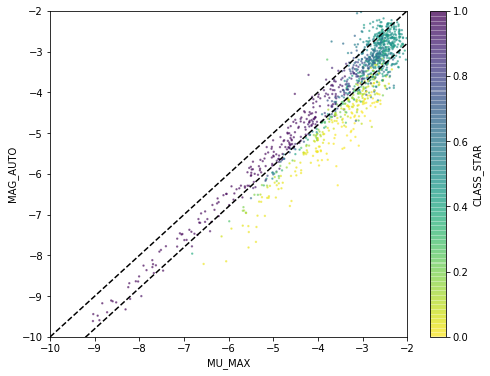

In [8]:
# Star cond
plt.figure(figsize=(8,6))
mag_auto = -2.5*np.log10(Datacube.Tab_SE["FLUX_AUTO"])
plt.scatter(Datacube.Tab_SE["MU_MAX"], mag_auto,
            c = Datacube.Tab_SE["CLASS_STAR"], s=2, cmap='viridis_r', alpha=0.5)
xx = np.linspace(-10,-2,100)
plt.plot(xx, xx-0.8, 'k--', xx, xx, 'k--')
plt.xlabel("MU_MAX")
plt.ylabel("MAG_AUTO")
plt.xlim(-10,-2)
plt.ylim(-10,-2)
cb = plt.colorbar()
cb.set_label("CLASS_STAR")

star_cond = ((abs(mag_auto-Datacube.Tab_SE["MU_MAX"]  + 0.4))<0.4) & (Datacube.Tab_SE['CLASS_STAR']>0.8)
np.sum(star_cond)

78
154
67


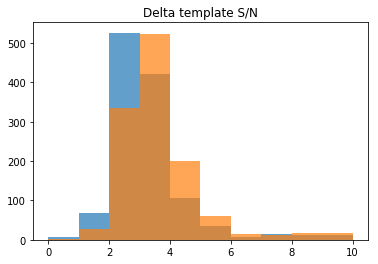

In [9]:
# Gaussian template
plt.hist(np.median(Datacube.CC_SNRs,axis=1),range=[0,10],bins=np.array([0,1,2,3,4,5,6,7,8,10]),alpha=0.7)
plt.hist(np.max(Datacube.CC_SNRs,axis=1),range=[0,10],bins=np.array([0,1,2,3,4,5,6,7,8,10]),alpha=0.7)
plt.title("Delta template S/N")

cond0 = (np.max(Datacube.CC_SNRs,axis=1)>7)&(dist_edge>5)  #&(Datacube.cc_flags==0)
cond1 = (np.max(Datacube.CC_SNRs,axis=1)>5)&(dist_edge>5)  #&(Datacube.cc_flags==0)
cond2 = (np.max(Datacube.CC_SNRs,axis=1)>5) & (np.max(Datacube.CC_SNRs,axis=1)<7) \
            & (dist_edge>5) & (~star_cond)   # & (Datacube.cc_flags==0)

print(np.sum(cond0))
print(np.sum(cond1))
print(np.sum(cond2))

67
SE Objects #4   S/N med: 4.81  max: 5.53


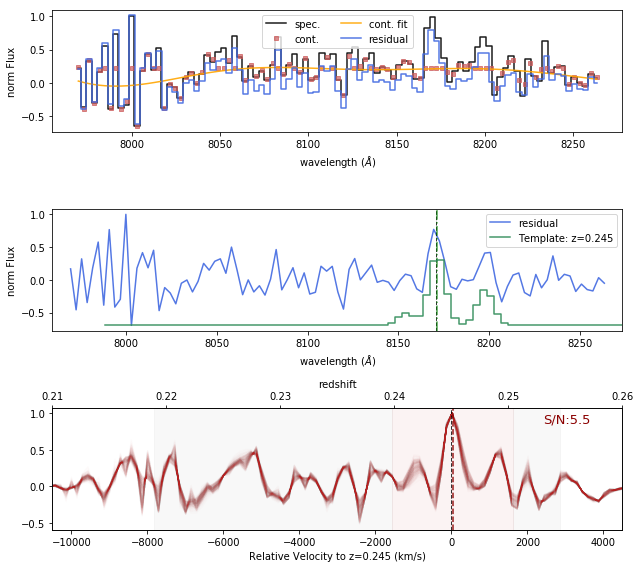

SE Objects #13   S/N med: 5.25  max: 5.44


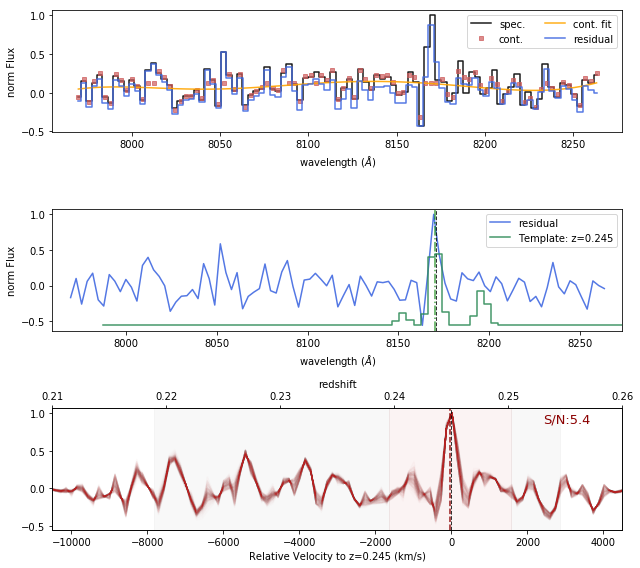

SE Objects #45   S/N med: 4.15  max: 5.37


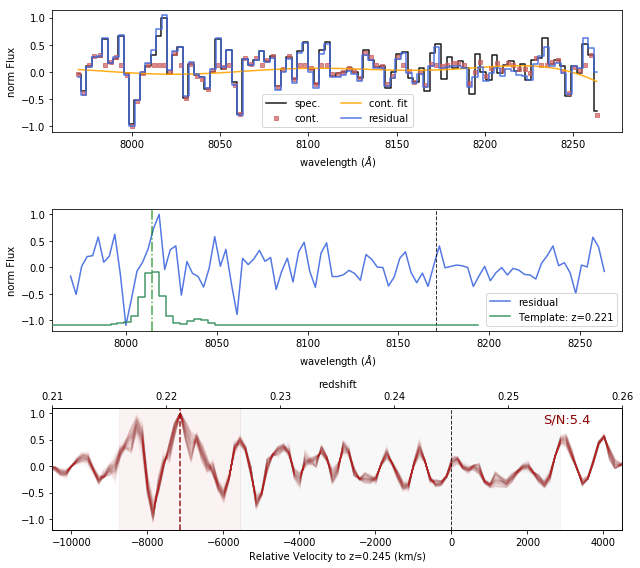

SE Objects #105   S/N med: 4.05  max: 5.33


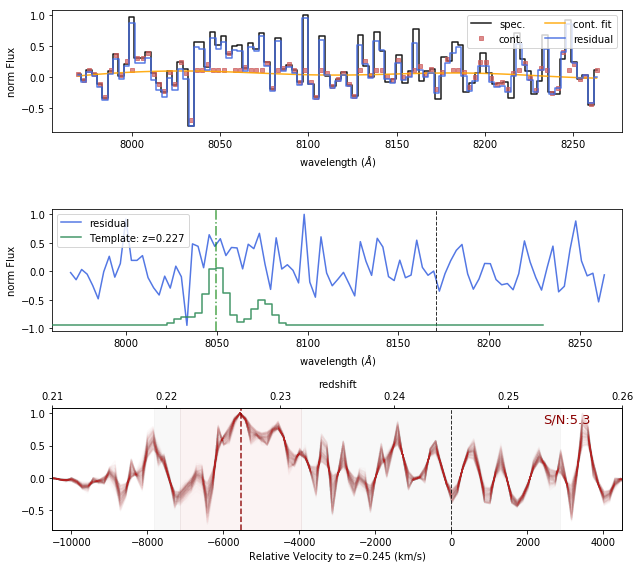

SE Objects #126   S/N med: 4.88  max: 5.2


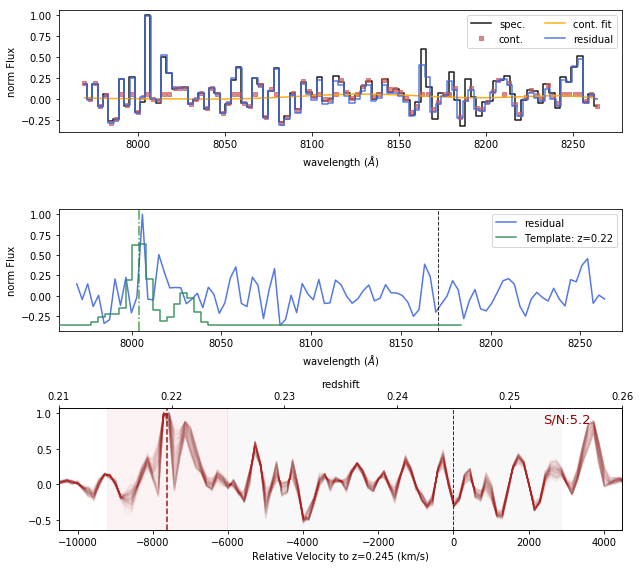

SE Objects #144   S/N med: 5.29  max: 5.53


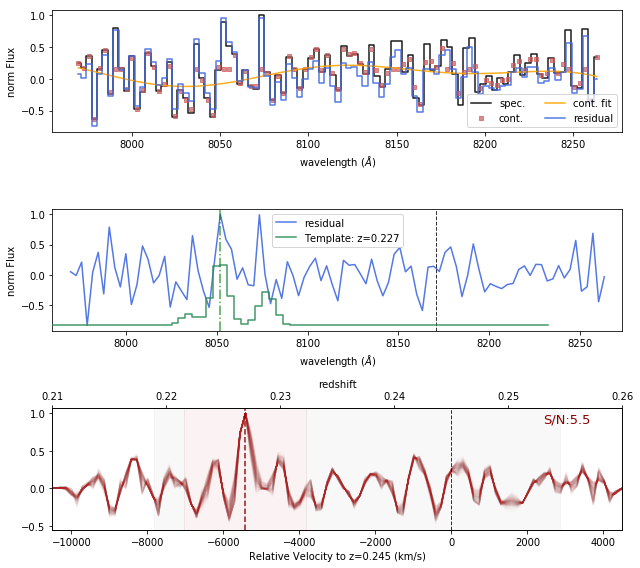

SE Objects #150   S/N med: 4.31  max: 5.11


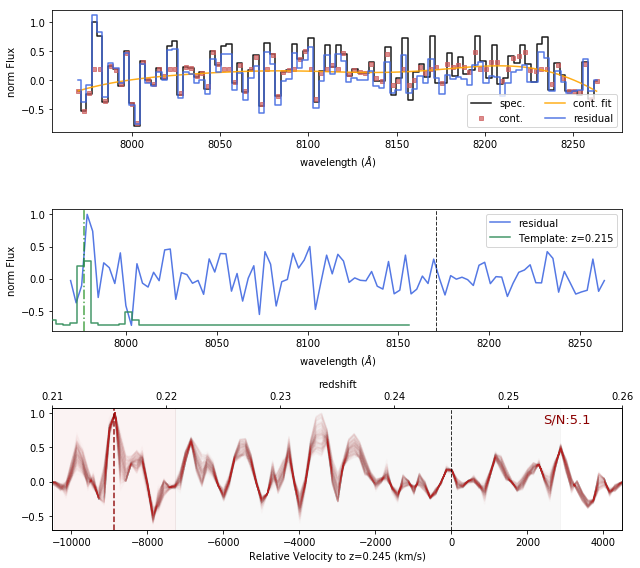

SE Objects #167   S/N med: 4.42  max: 5.18


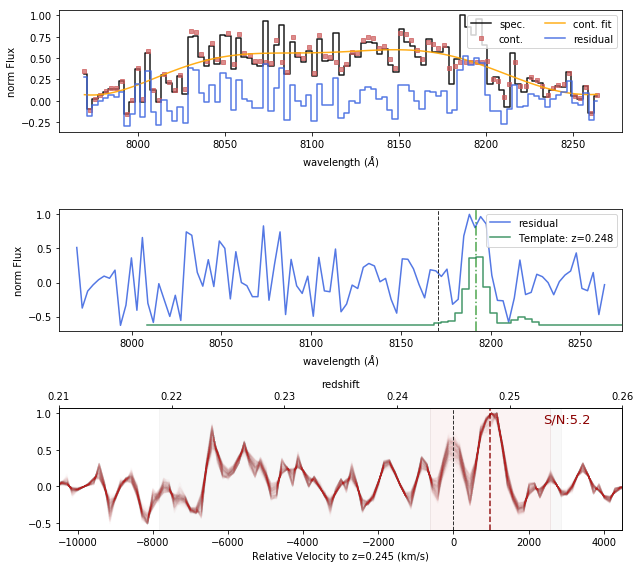

SE Objects #192   S/N med: 4.79  max: 5.64


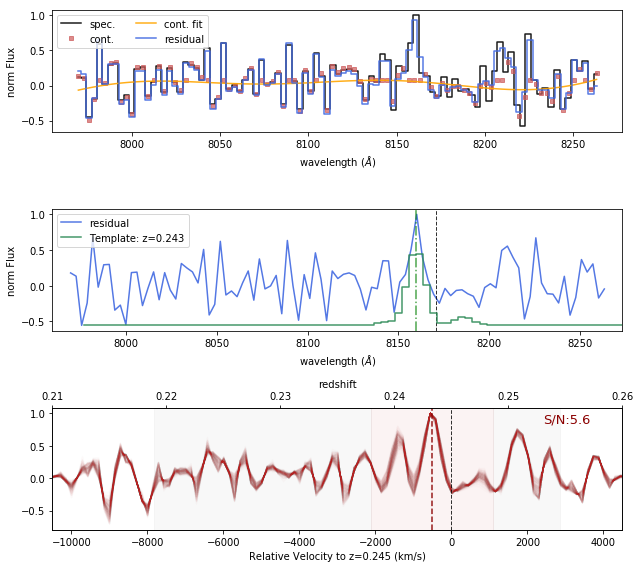

SE Objects #251   S/N med: 4.83  max: 5.36


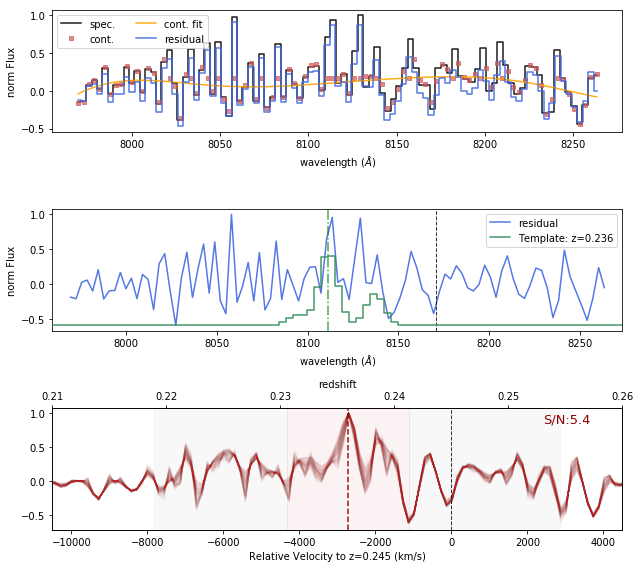

SE Objects #254   S/N med: 4.19  max: 5.09


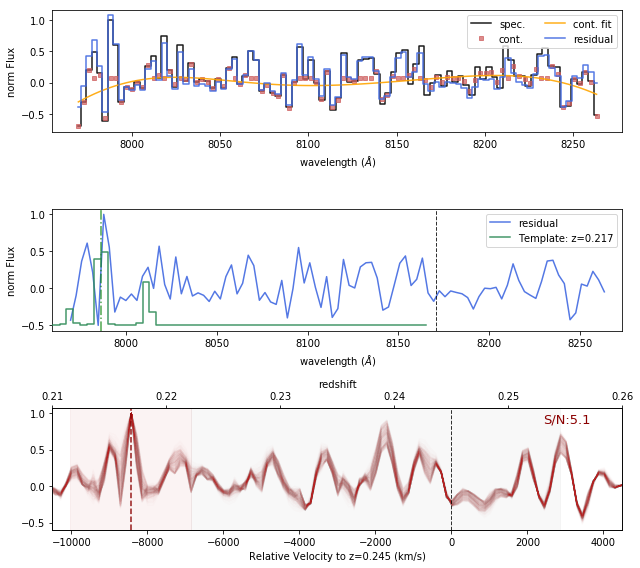

SE Objects #257   S/N med: 5.15  max: 5.54


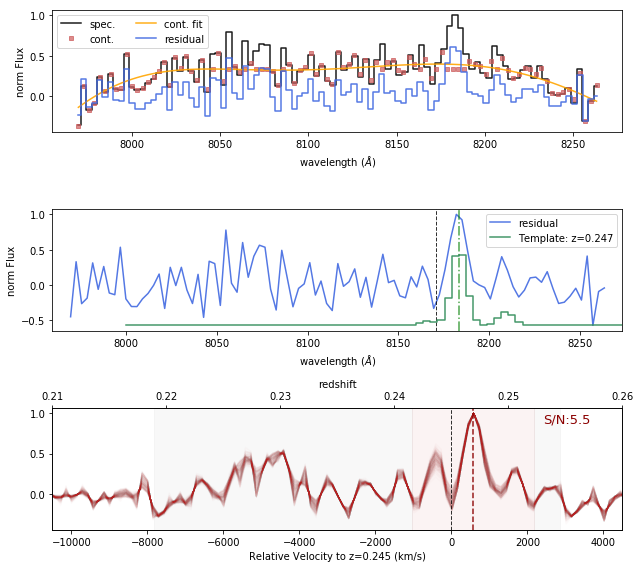

SE Objects #271   S/N med: 5.02  max: 5.81


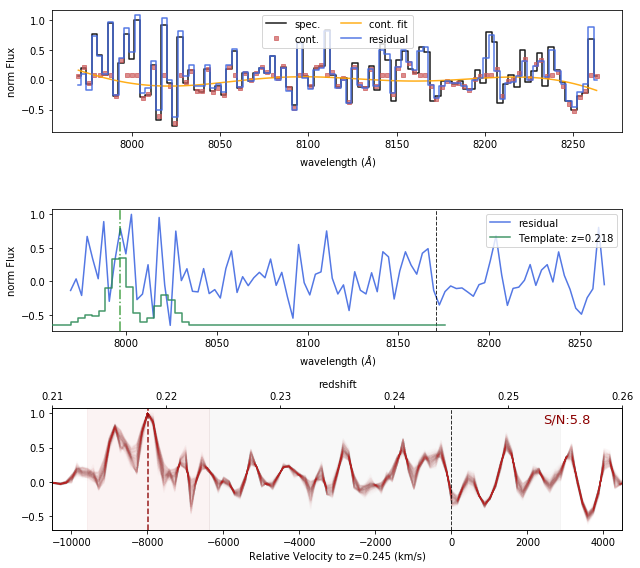

SE Objects #274   S/N med: 5.32  max: 5.45


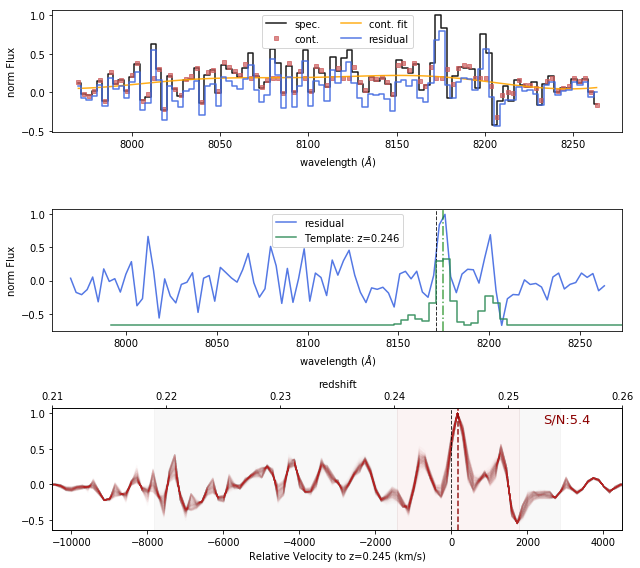

SE Objects #306   S/N med: 4.12  max: 5.11


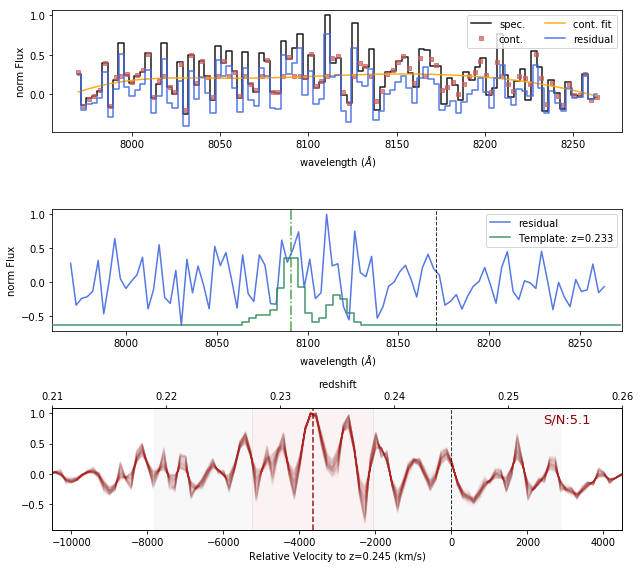

SE Objects #325   S/N med: 4.68  max: 5.5


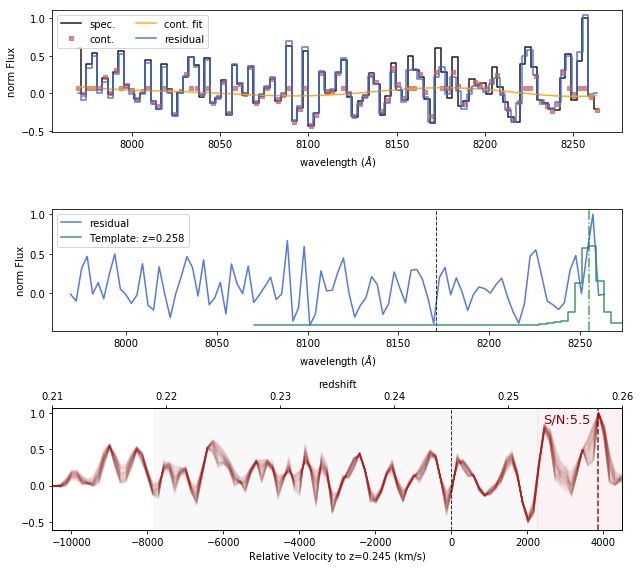

SE Objects #338   S/N med: 5.6  max: 6.01


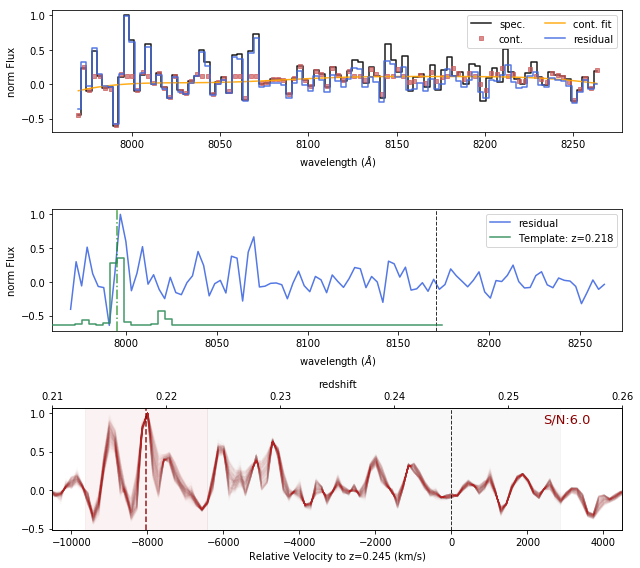

SE Objects #349   S/N med: 4.25  max: 5.21


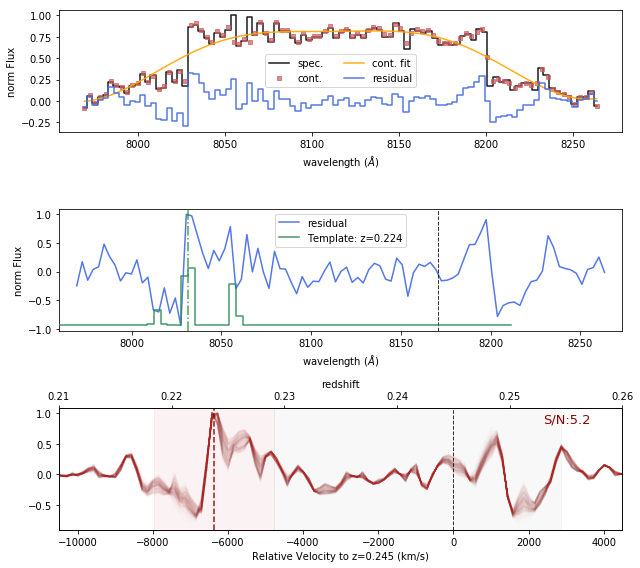

SE Objects #410   S/N med: 4.52  max: 5.84


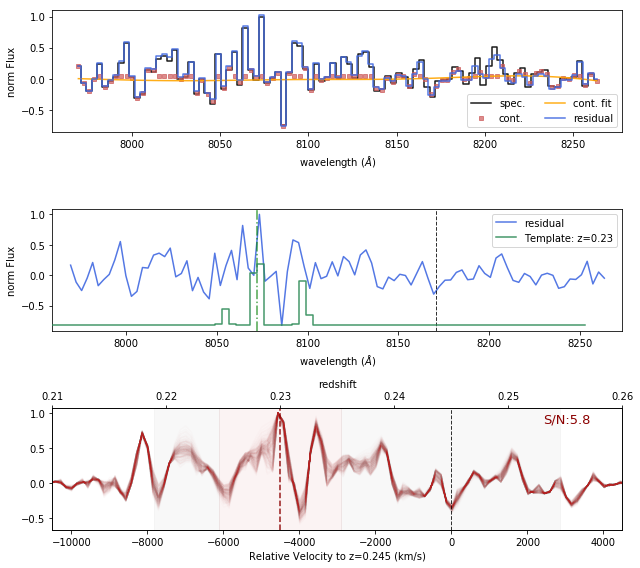

SE Objects #429   S/N med: 5.25  max: 6.69


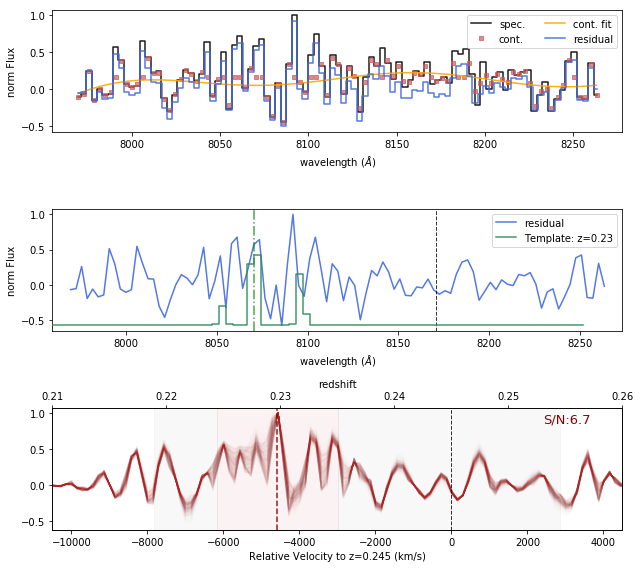

SE Objects #452   S/N med: 4.42  max: 5.34


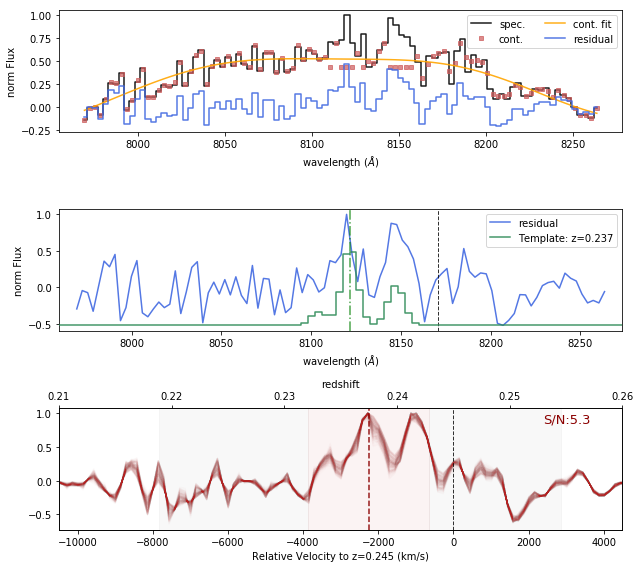

SE Objects #455   S/N med: 5.95  max: 6.12


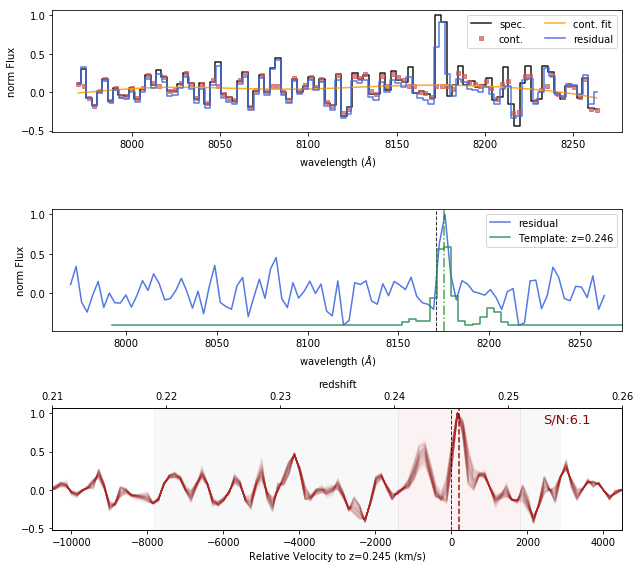

SE Objects #468   S/N med: 5.78  max: 6.72


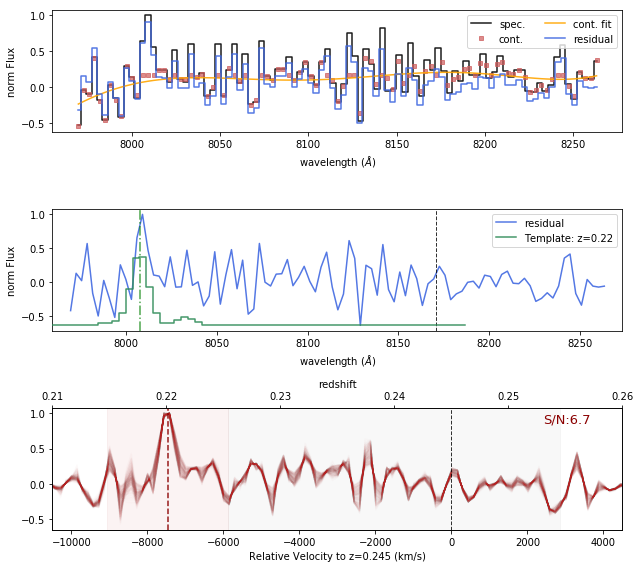

SE Objects #470   S/N med: 4.87  max: 5.89


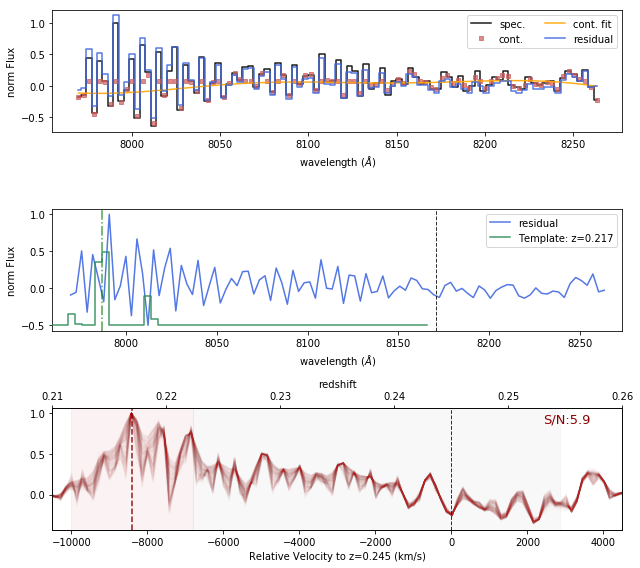

SE Objects #488   S/N med: 5.38  max: 6


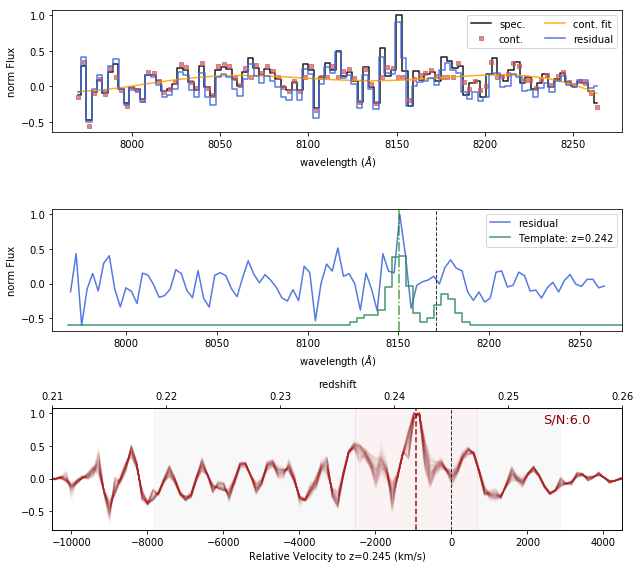

SE Objects #499   S/N med: 5.51  max: 5.92


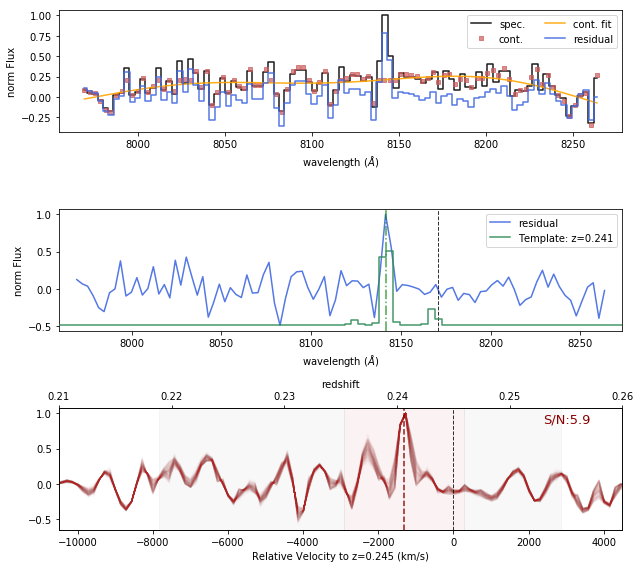

SE Objects #501   S/N med: 5.43  max: 5.86


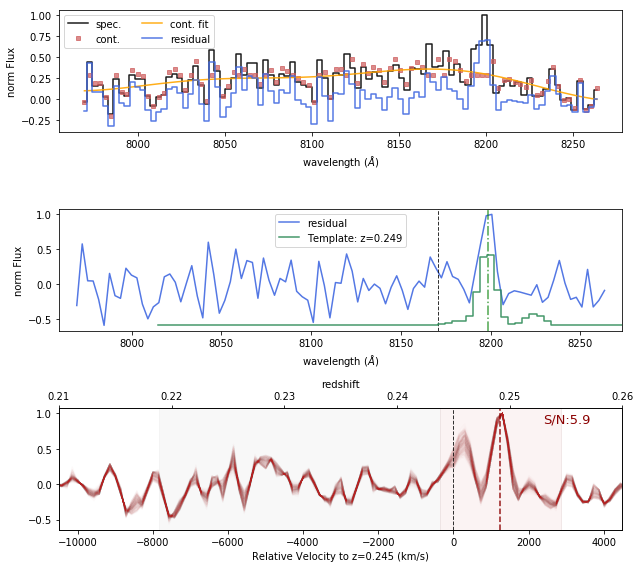

SE Objects #507   S/N med: 5.32  max: 5.7


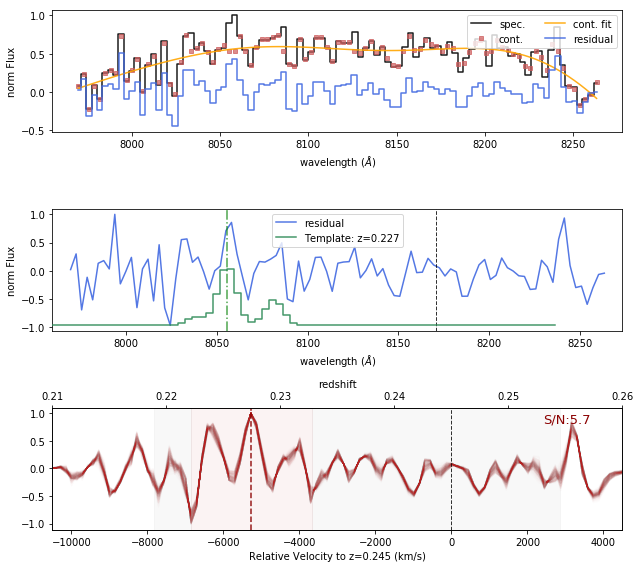

SE Objects #526   S/N med: 5.93  max: 6.12


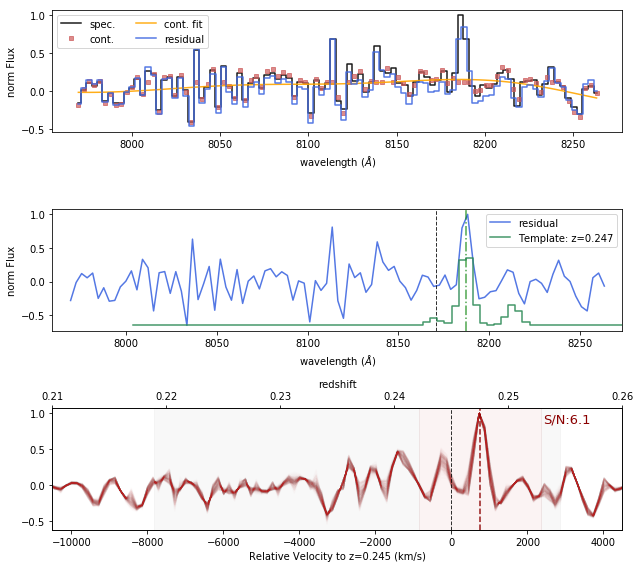

SE Objects #531   S/N med: 4.63  max: 5.6


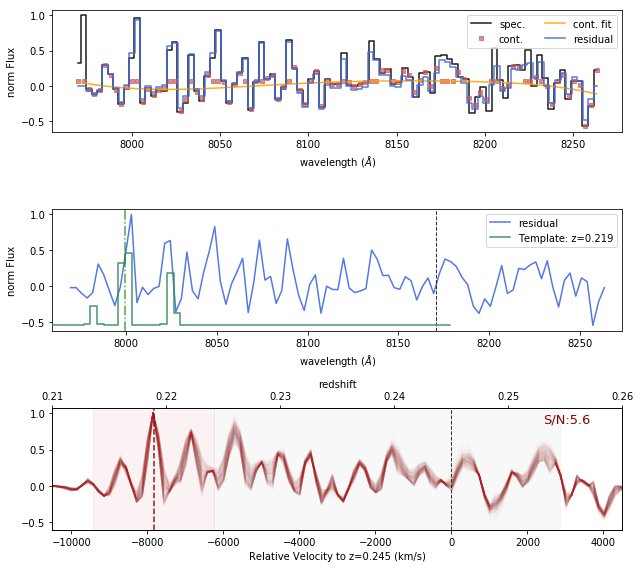

SE Objects #536   S/N med: 4.87  max: 5.17


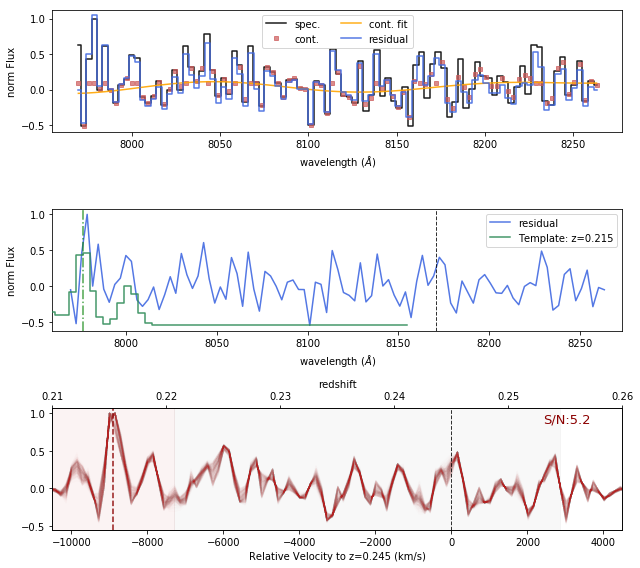

SE Objects #569   S/N med: 5.7  max: 6.36


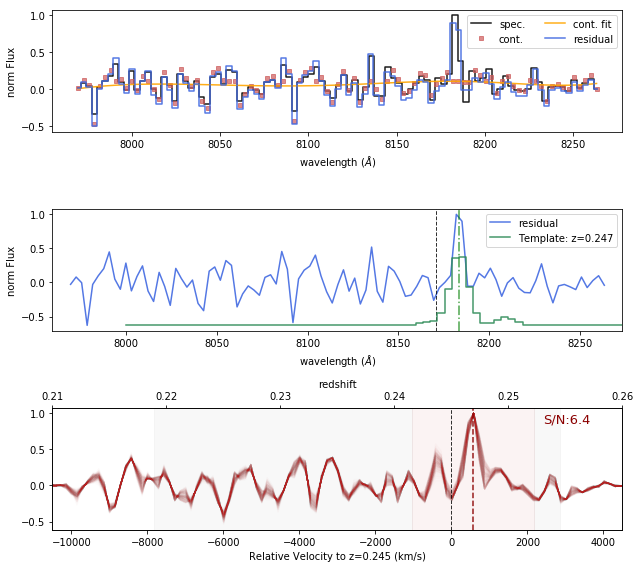

SE Objects #588   S/N med: 5.32  max: 5.74


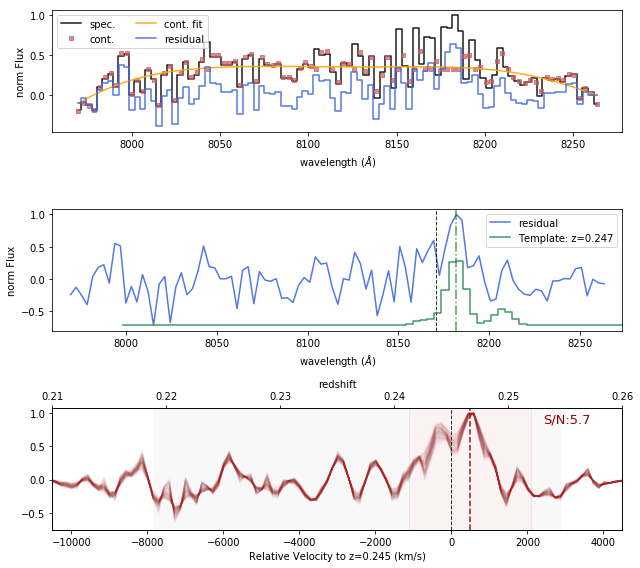

SE Objects #589   S/N med: 5.35  max: 5.73


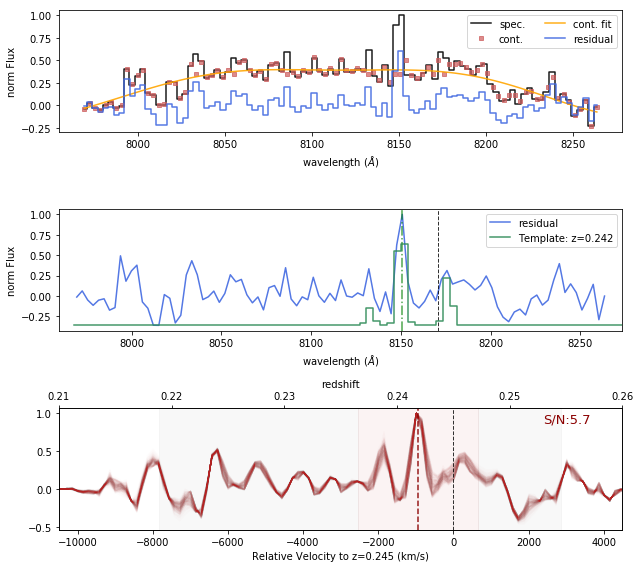

SE Objects #608   S/N med: 4.85  max: 5.09


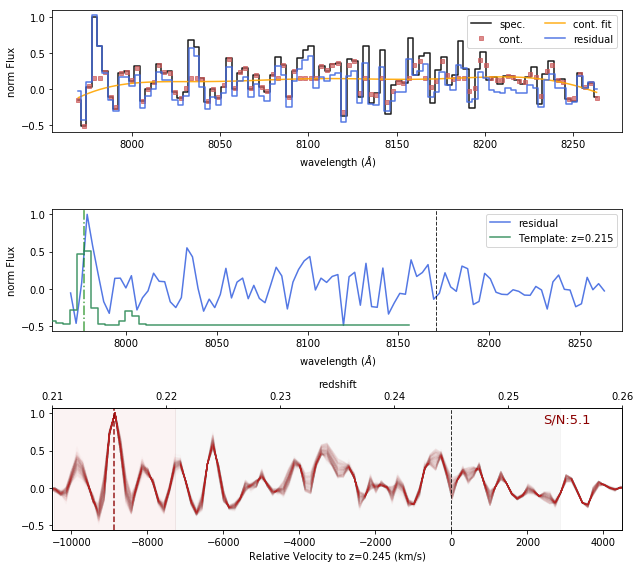

SE Objects #610   S/N med: 6.45  max: 6.66


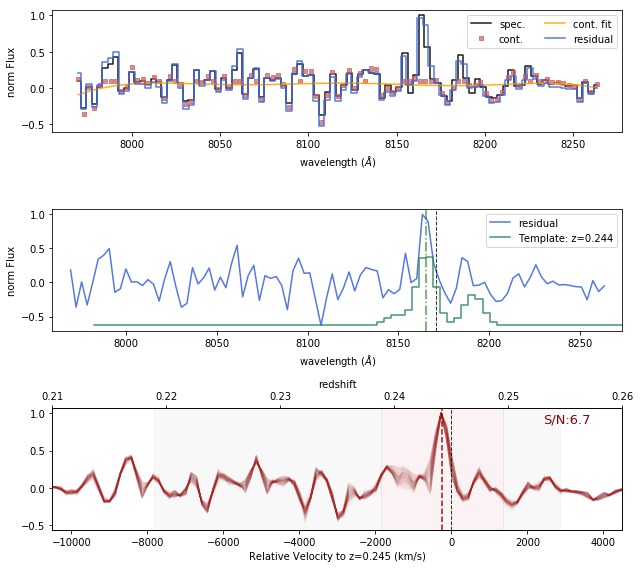

SE Objects #611   S/N med: 4.58  max: 5.38


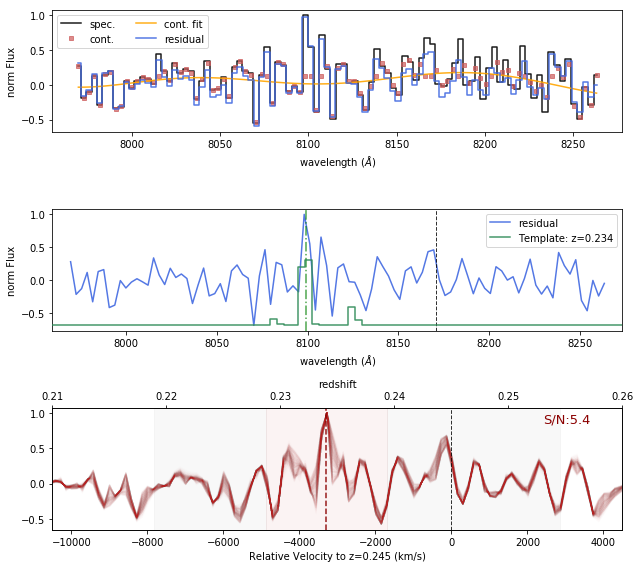

SE Objects #619   S/N med: 5.34  max: 5.55


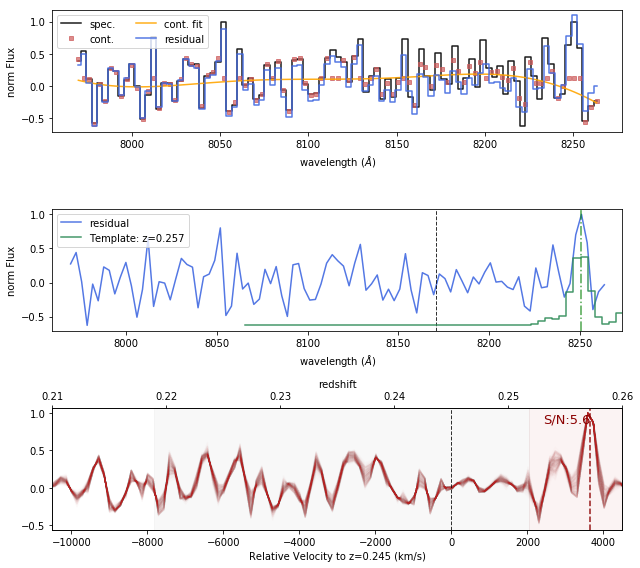

SE Objects #620   S/N med: 5.52  max: 5.94


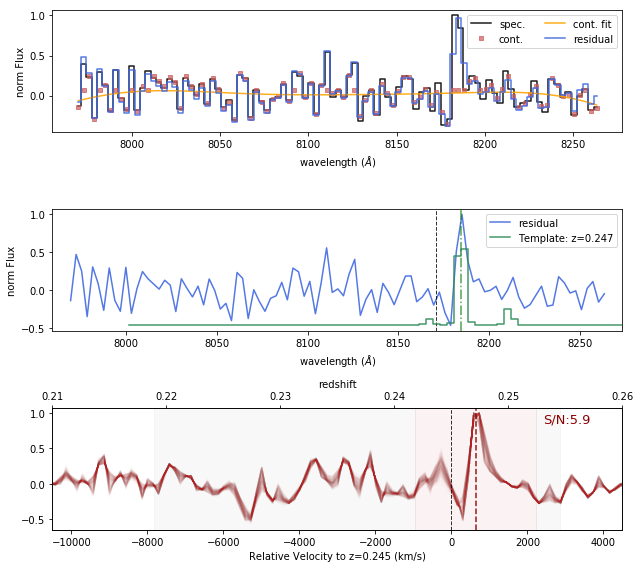

SE Objects #640   S/N med: 4.72  max: 5.26


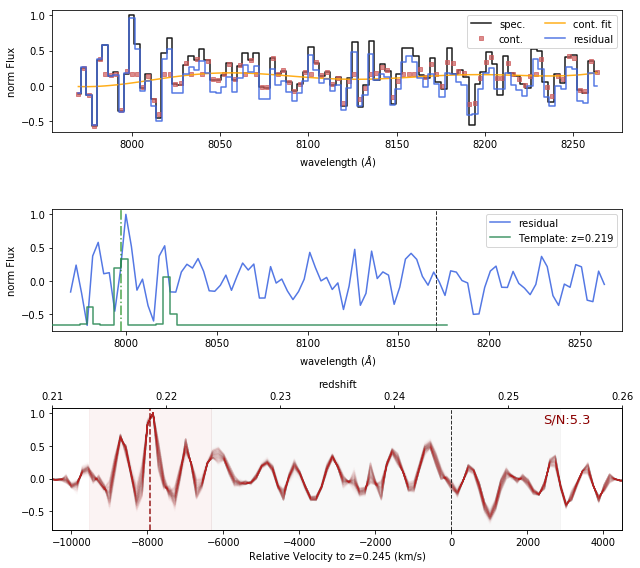

SE Objects #705   S/N med: 4.67  max: 5.32


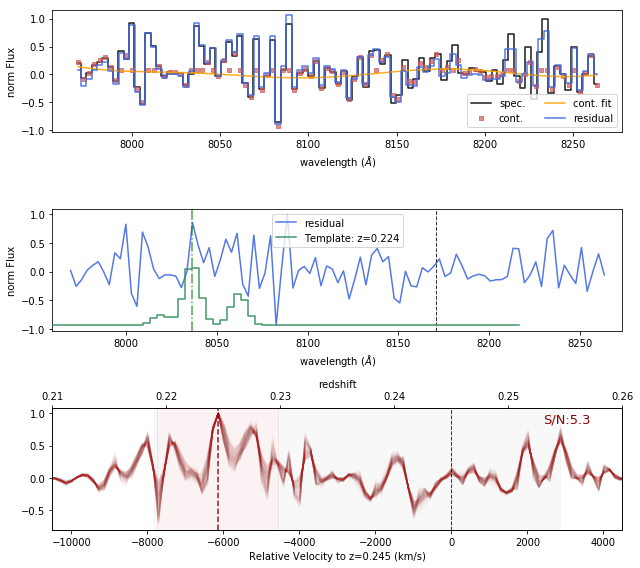

SE Objects #709   S/N med: 6.43  max: 6.82


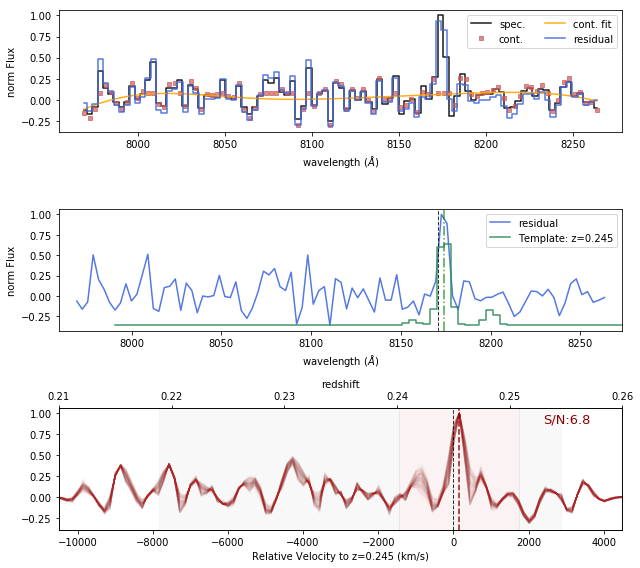

SE Objects #732   S/N med: 4.42  max: 5.56


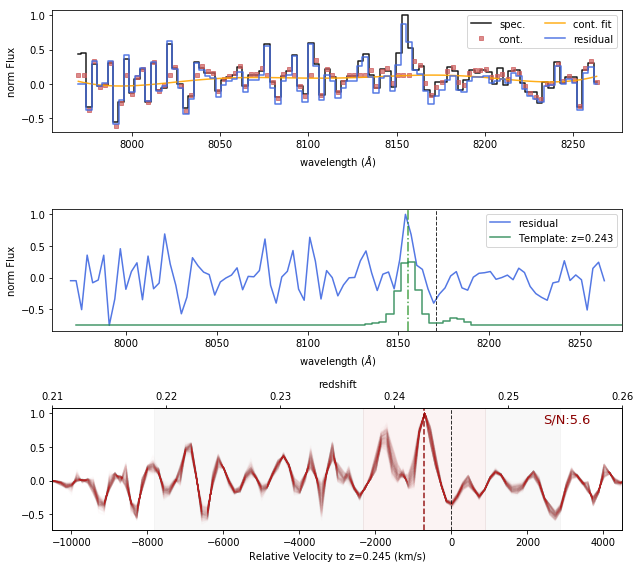

SE Objects #737   S/N med: 5.5  max: 6.55


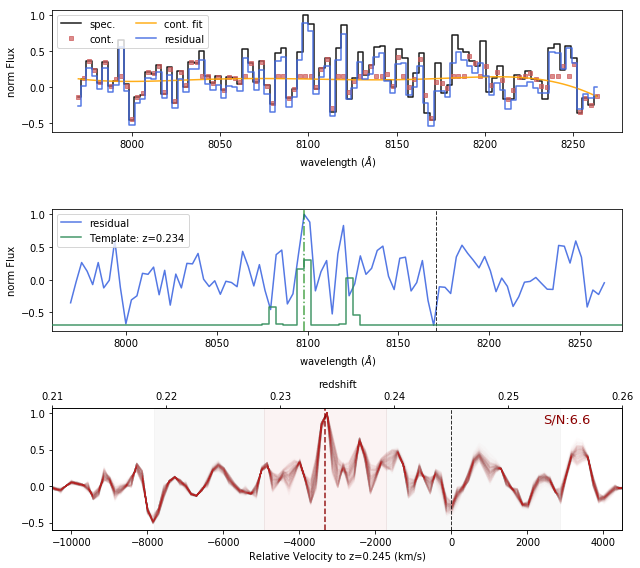

SE Objects #740   S/N med: 4.98  max: 5.79


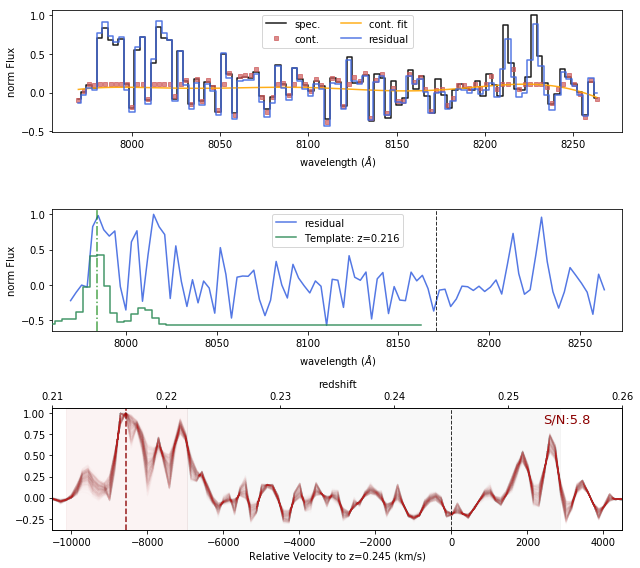

SE Objects #751   S/N med: 5.02  max: 5.28


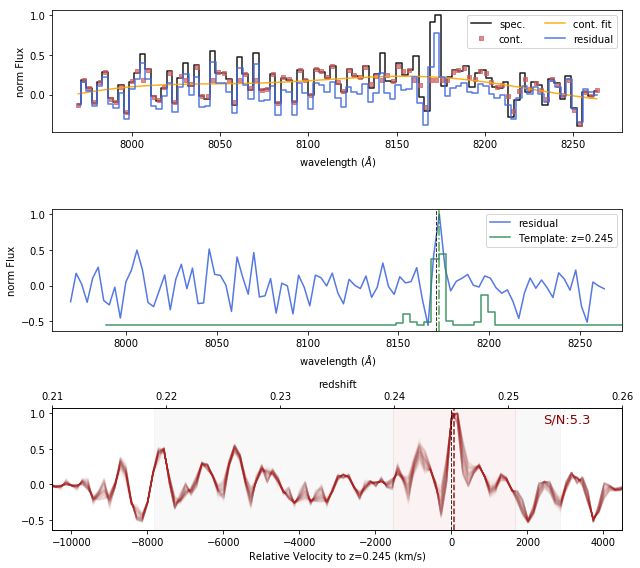

SE Objects #785   S/N med: 4.79  max: 5.09


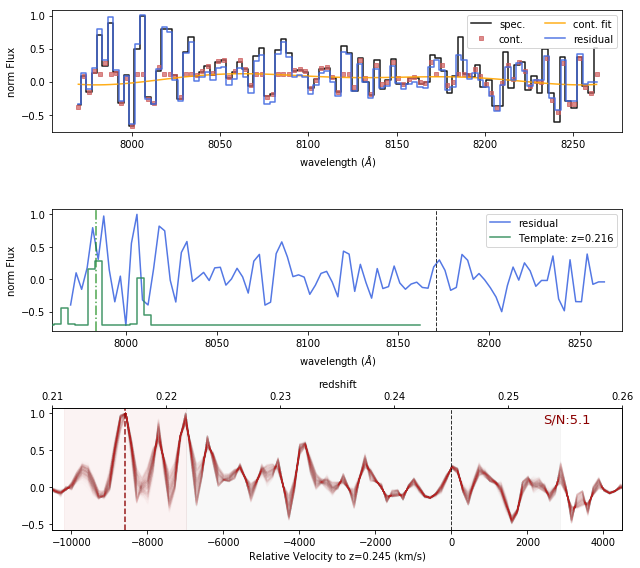

SE Objects #795   S/N med: 5.66  max: 5.78


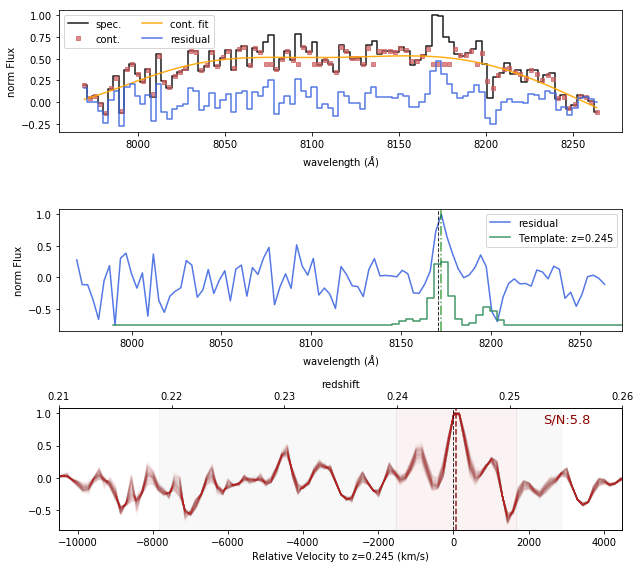

SE Objects #857   S/N med: 5.19  max: 5.62


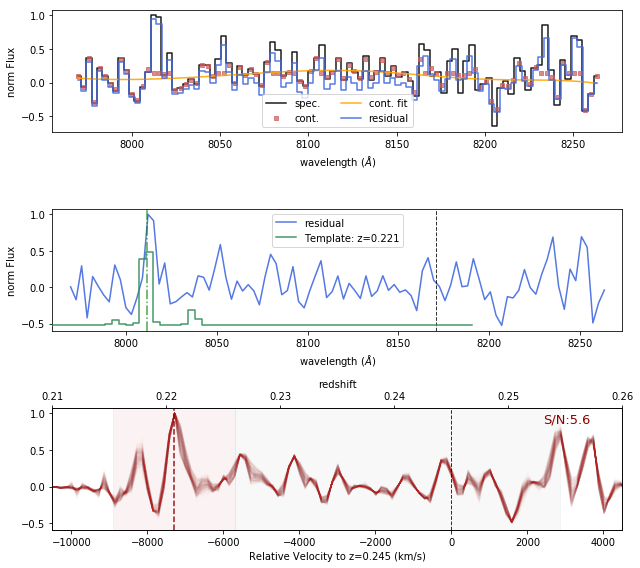

SE Objects #875   S/N med: 4.89  max: 5.03


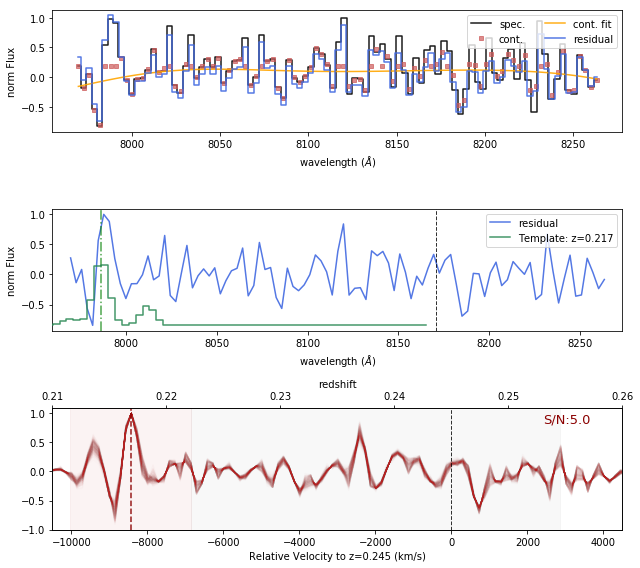

SE Objects #887   S/N med: 4.59  max: 5.75


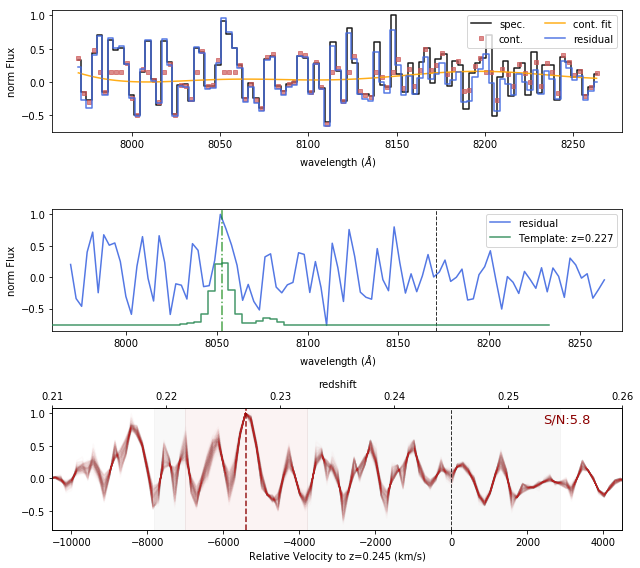

SE Objects #916   S/N med: 4.59  max: 5.13


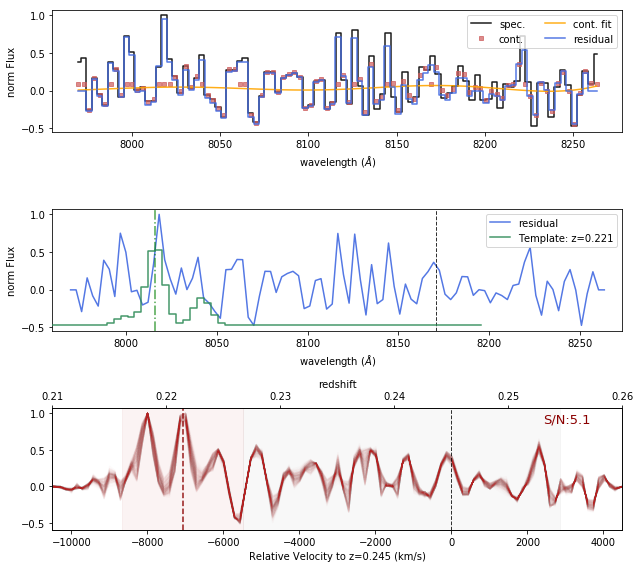

SE Objects #939   S/N med: 4.81  max: 5.16


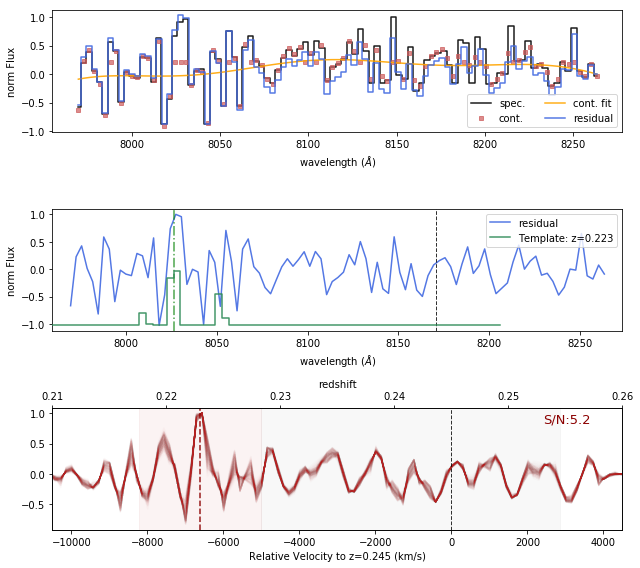

SE Objects #962   S/N med: 4.49  max: 5.4


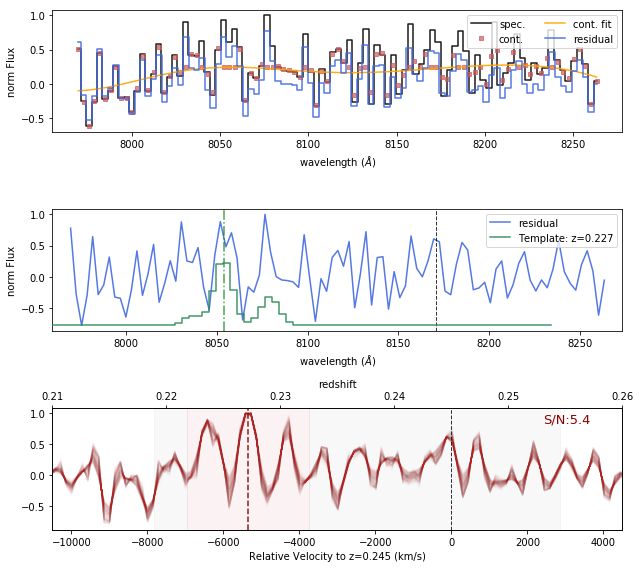

SE Objects #973   S/N med: 5.33  max: 5.74


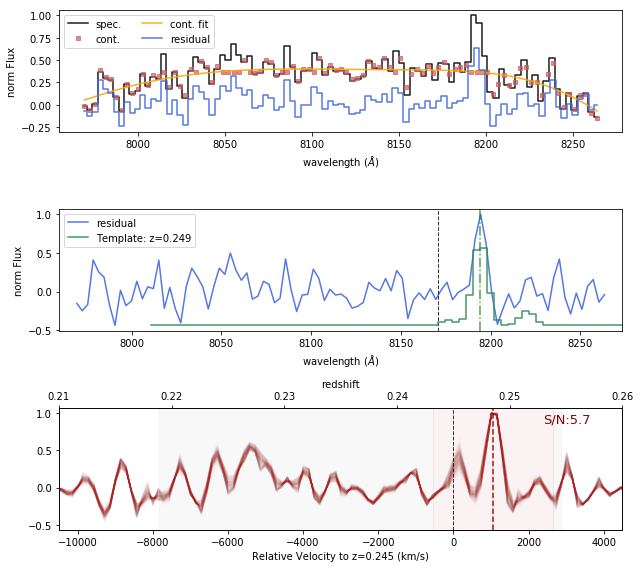

SE Objects #995   S/N med: 4.94  max: 5.37


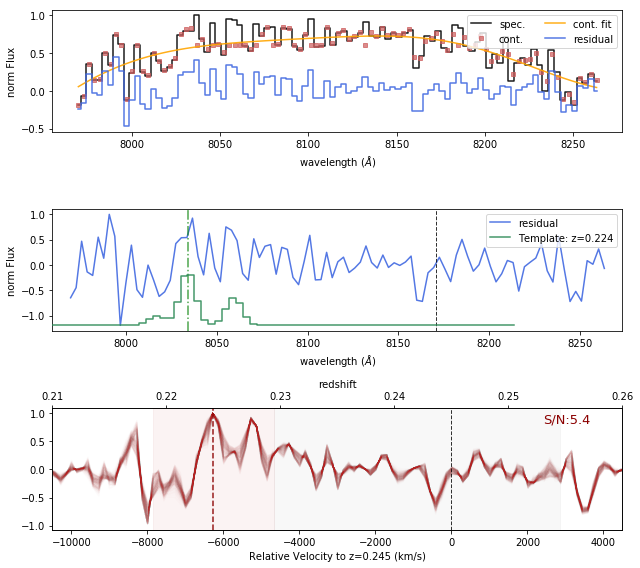

SE Objects #1058   S/N med: 4.98  max: 5.57


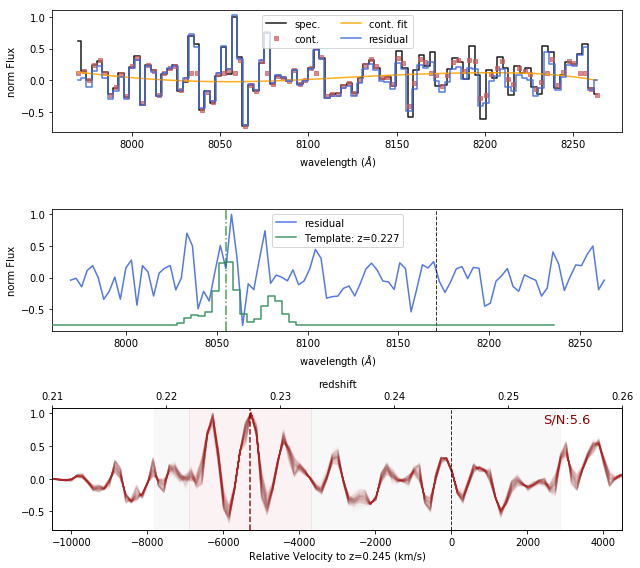

SE Objects #1071   S/N med: 5.24  max: 5.51


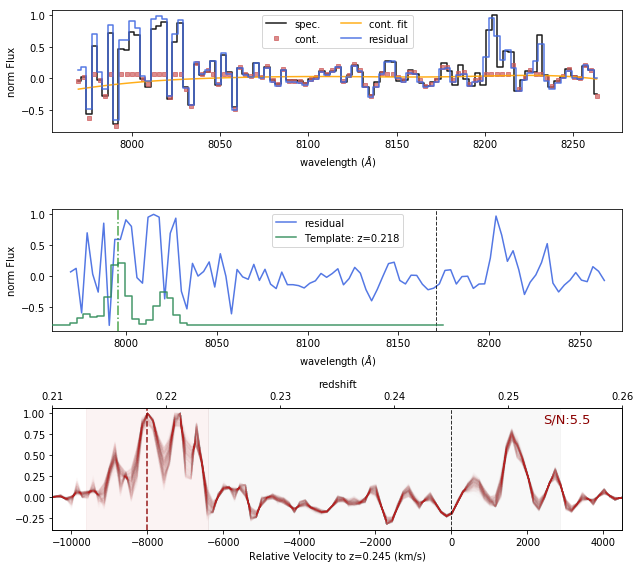

SE Objects #1077   S/N med: 5.77  max: 6.87


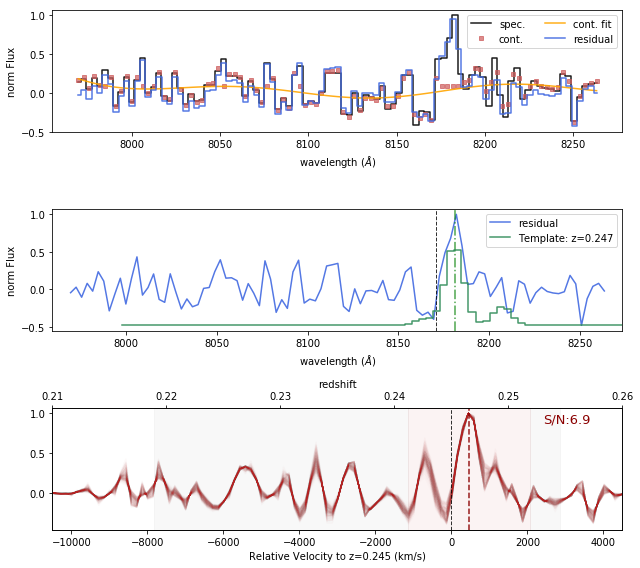

SE Objects #1086   S/N med: 5.52  max: 6.47


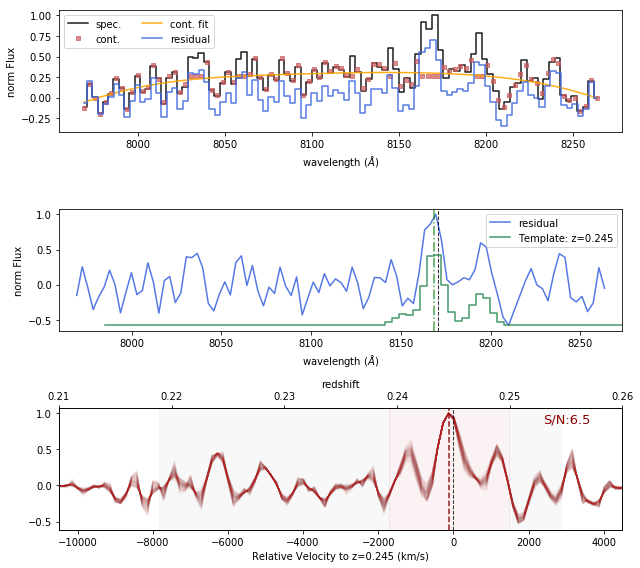

SE Objects #1110   S/N med: 5.56  max: 5.68


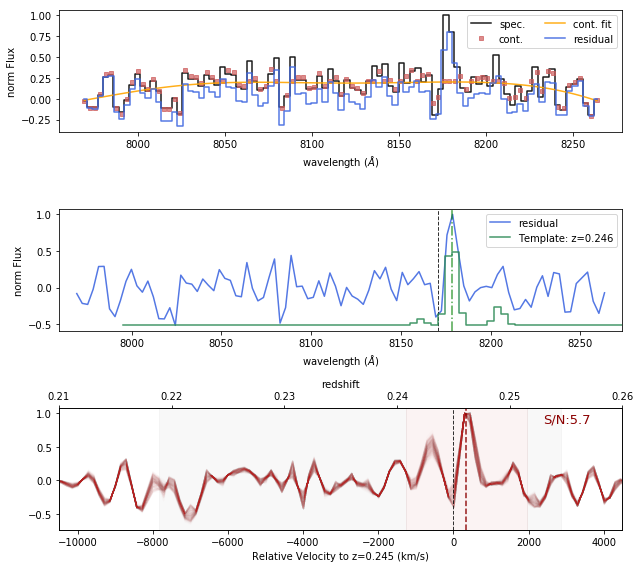

SE Objects #1169   S/N med: 4.98  max: 5.24


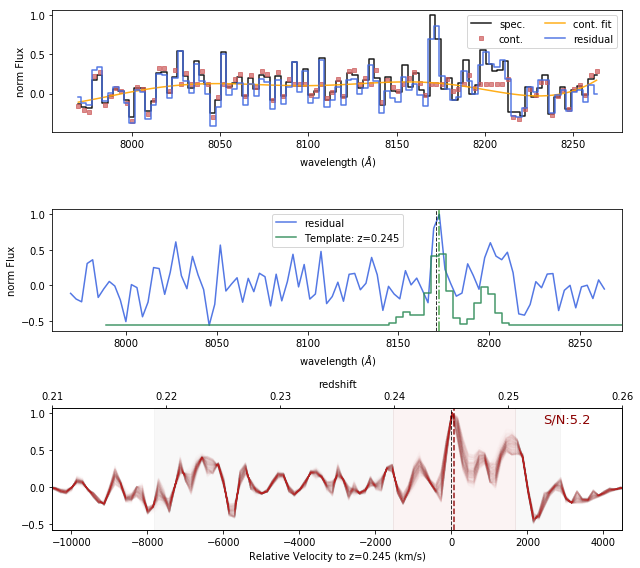

SE Objects #1178   S/N med: 5.82  max: 6.66


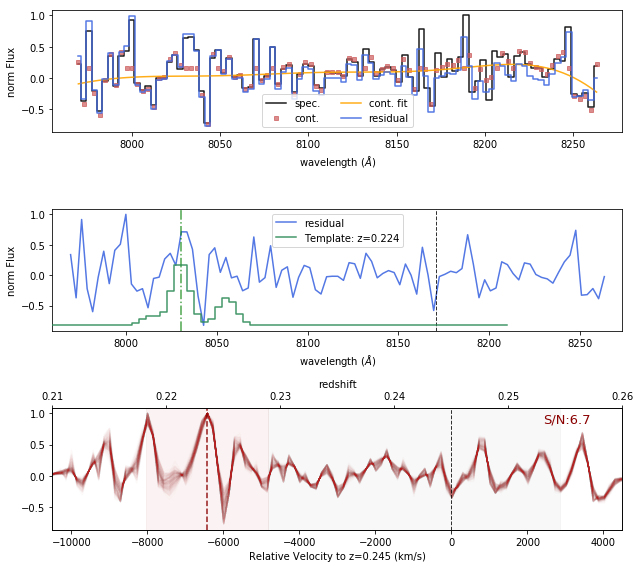

SE Objects #1181   S/N med: 4.96  max: 5.71


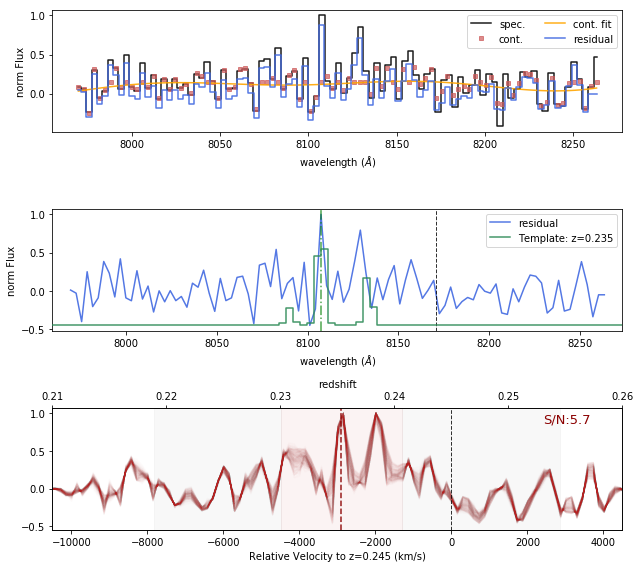

SE Objects #1198   S/N med: 5.61  max: 6.1


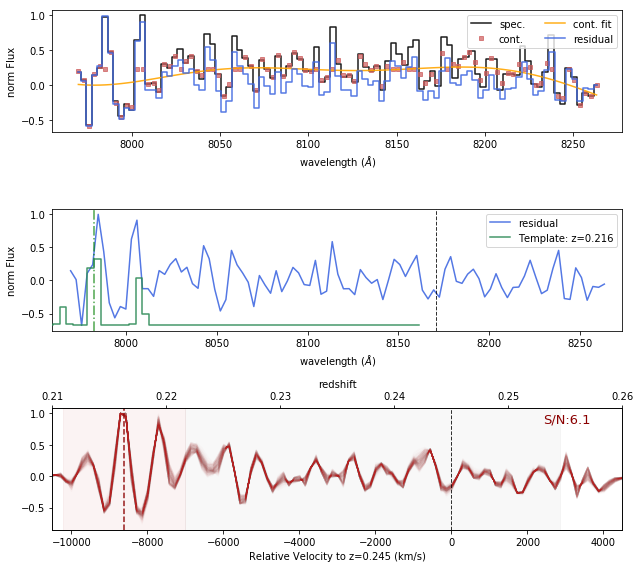

SE Objects #1210   S/N med: 5.03  max: 5.72


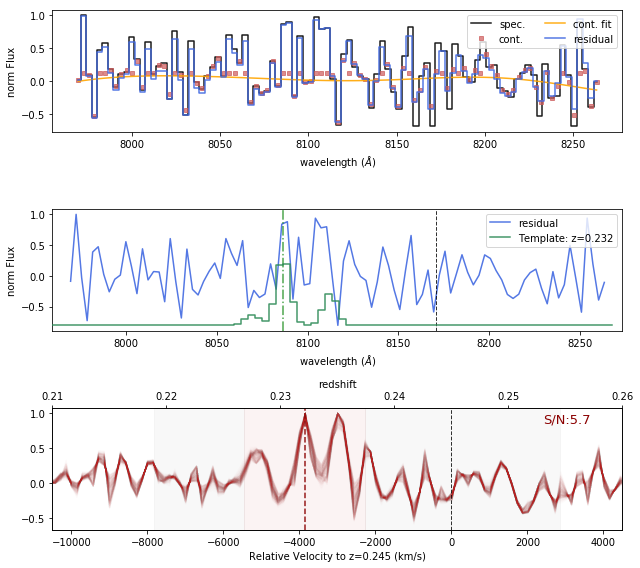

SE Objects #1218   S/N med: 4.22  max: 5.09


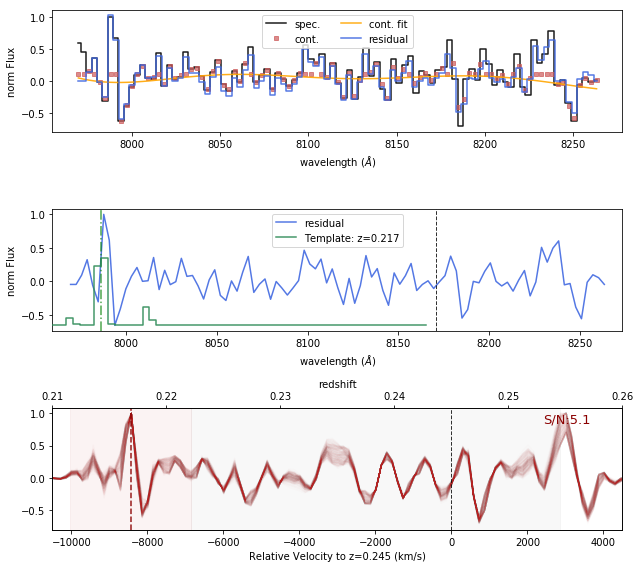

In [16]:
cond = cond2
print(np.sum(cond))
for j, (cc_num) in enumerate(Datacube.cc_nums[cond]):
    ccs, rv, z_ccs, SNR_ps, flag = Datacube.cross_correlation(cc_num)
#     plt.savefig("./A2465C/fig/xcorr_gau/SNb/CC#%d.png"%(cc_num), dpi=150)
    plt.show()
    plt.close()

In [10]:
Datacube.save_cc_fits(save_path='./A2465C/')

In [18]:
#Composite 
import re
import glob
el_ls = glob.glob("./A2465C/fig/xcorr_gau/SNb/*.png")
for el in el_ls:
    img_cc = plt.imread(el)
    version, ind = re.compile(r'\d+').findall(el)
    img_spec = plt.imread("./A2465C/fig/spec/SE#%s.png"%ind)
    img_thumb = plt.imread("./A2465C/fig/img_thumb/SE#%s.png"%ind)
    plt.figure(figsize=(18,9))
    ax1 = plt.subplot2grid((2, 3), (0, 0), colspan=2, rowspan=2)
    ax2 = plt.subplot2grid((2, 3), (0, 2), colspan=1, rowspan=1)
    ax3 = plt.subplot2grid((2, 3), (1, 2), colspan=1, rowspan=1)
    ax1.imshow(img_cc)
    ax2.imshow(img_spec)
    ax3.imshow(img_thumb)
    ax1.axis("off")
    ax2.axis("off")
    ax3.axis("off")
    plt.suptitle("Flag: 1",fontsize=18)
    plt.tight_layout()
    plt.savefig("./A2465C/fig/candidate_v2/SNb/#EL-%s.png"%ind,dpi=200)
    plt.close()

## 5. Centroid Analysis

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.stats import SigmaClip

import warnings
warnings.filterwarnings('ignore')
from pipeline import *
from utils import *
import glob
import re

Datacube = Read_Datacube("/home/qliu/data/A2465C_cube.fits", name="A2465C", z0=0.228, SE_catalog="./A2465C/SE/A2465C_run2.cat")
Datacube.read_mask('/home/qliu/data/Raw_stack_A2465C_mask.fits')
Datacube.read_seg('./A2465C/SE/segment_run2.fits')
Datacube.read_spec('./A2465C/A2465C-spec.fits')
Datacube.read_cc('./A2465C/A2465C-cc.fits')

Datacube.read_cluster_boundary("./A2465C/A2465C_bound.fits")
id_BCG1 = np.argmin((Datacube.Tab_SE["X_IMAGE"]-707)**2 + (Datacube.Tab_SE["Y_IMAGE"]-1385)**2)
id_BCG2 = np.argmin((Datacube.Tab_SE["X_IMAGE"]-1446)**2 + (Datacube.Tab_SE["Y_IMAGE"]-679)**2)


pos_BCG = Datacube.assign_BCG_position(id_BCG=[id_BCG1,id_BCG2])

In [3]:
# SNa sample after a visual screen for strong lines
el_ls_v = glob.glob("./A2465C/fig/candidate_v2/SNv/*.png")
Num_v = np.sort(np.array([re.compile(r'\d+').findall(el)[-1] for el in el_ls_v]).astype("int"))
Num_v

array([   4,   13,   15,   34,   76,   80,  126,  134,  141,  150,  151,
        167,  195,  216,  221,  229,  240,  254,  257,  259,  264,  274,
        276,  301,  305,  310,  313,  338,  354,  364,  400,  410,  423,
        452,  455,  472,  475,  476,  479,  488,  489,  490,  499,  501,
        503,  505,  507,  515,  526,  537,  538,  541,  544,  548,  552,
        555,  560,  564,  569,  577,  588,  589,  601,  602,  605,  609,
        610,  611,  620,  628,  647,  685,  692,  709,  732,  736,  737,
        749,  751,  752,  755,  756,  795,  857,  875,  908,  946,  947,
        966,  973,  995, 1013, 1053, 1054, 1067, 1075, 1077, 1084, 1086,
       1100, 1104, 1110, 1129, 1136, 1150, 1151, 1158, 1163, 1169, 1181,
       1191, 1200])

Text(0.5,0,'A2390 Candidate Redshift')

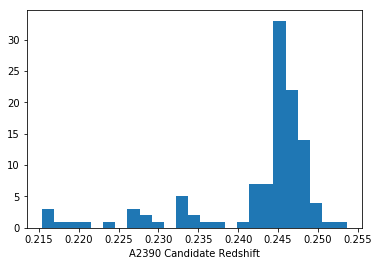

In [7]:
plt.hist(Datacube.z_best[Num_v-1],bins=25)
plt.xlabel("A2390 Candidate Redshift")

optimal aperture:2.2
PA: -67.199,  Cluster-centric angle: 36.435


(103.63424073507507, 0.34909050330689084, 524.1109109525291)

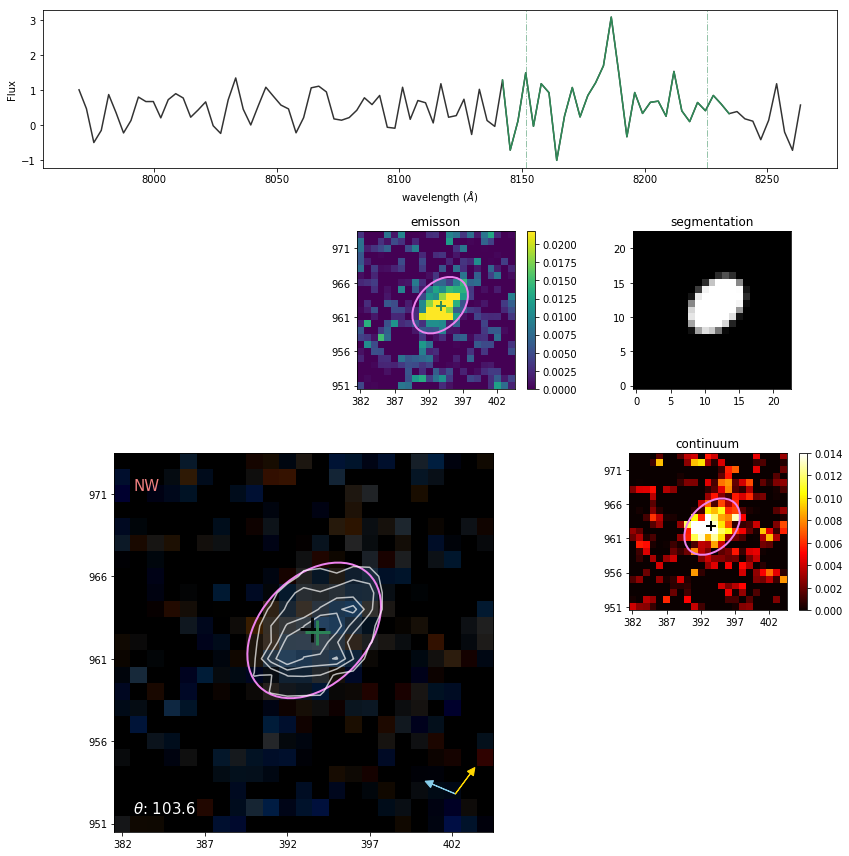

In [2]:
Datacube.centroid_analysis(num=601, centroid_type='APER')

PA: -83.326,  Cluster-centric angle: 36.435


(119.76075571992506, 0.41585289204491327, 524.1109109525291)

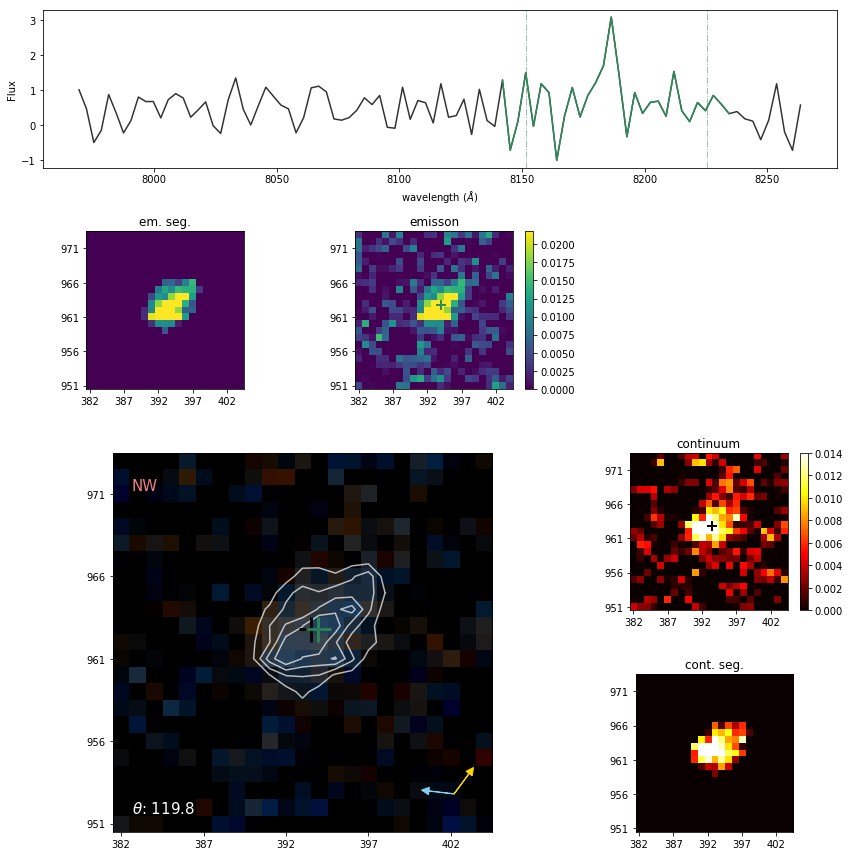

In [4]:
num = 601
obj_SE = Object_SE(Datacube.Tab_SE[Datacube.Tab_SE["NUMBER"]==num], k_wid=5, 
                   img_seg=Datacube.img_seg, cube=Datacube.datacube, mask_field=Datacube.mask_edge)
spec = Datacube.obj_specs_opt[Datacube.obj_nums==num][0]
k_aper =  Datacube.k_apers_opt[Datacube.obj_nums==num][0]

compute_centroid_offset(obj_SE, k_aper=k_aper, spec=spec, wavl=Datacube.wavl, 
                        z_cc=Datacube.z_best[num-1], centroid_type="ISO2", 
                        pos_BCG = pos_BCG, affil_map=boundary)

optimal aperture:2.1
PA: -169.404,  Cluster-centric angle: -135.340


(34.06336224502337, 0.5101093930041211, 687.9405526308868)

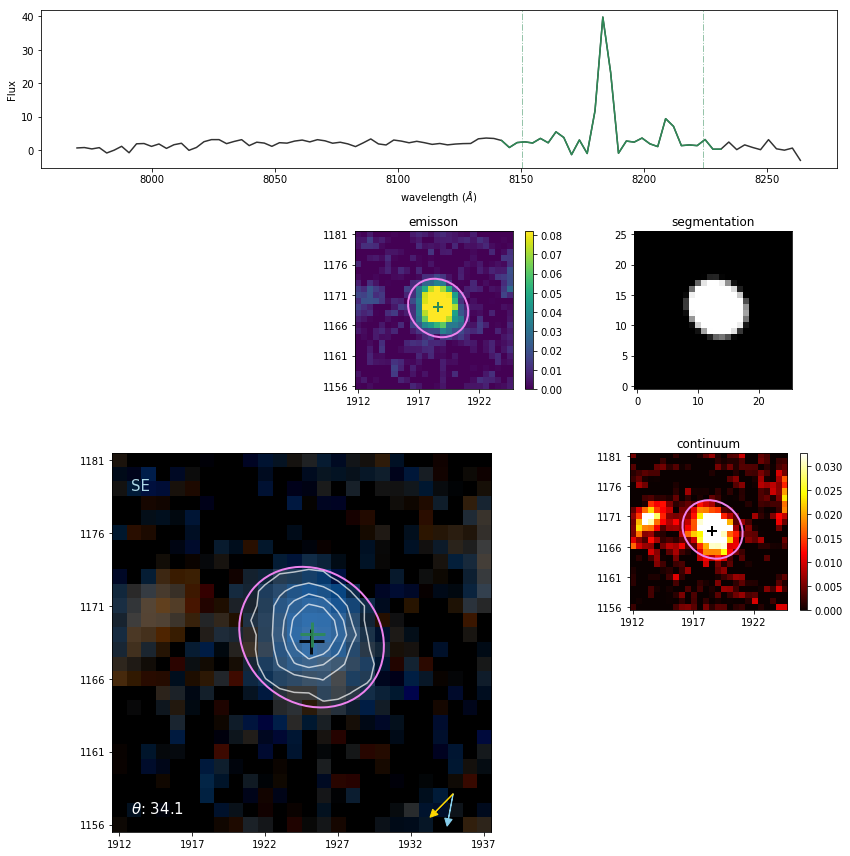

In [3]:
Datacube.centroid_analysis(num=1158, centroid_type='APER')

/home/qliu/anaconda3/lib/python3.6/site-packages/skimage/util/arraycrop.py:175: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  cropped = np.array(ar[slices], order=order, copy=True)


PA: -161.135,  Cluster-centric angle: -135.340


(25.794429621215215, 0.5808063120134119, 687.9405526308868)

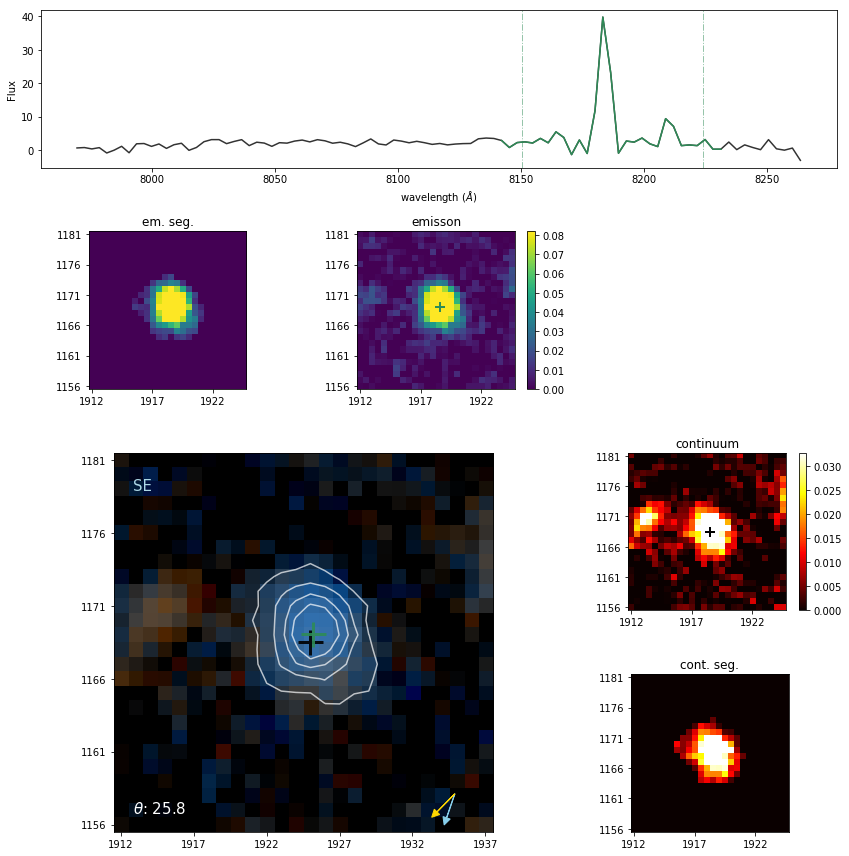

In [20]:
num = 1158
ind = (Datacube.obj_nums==num)
obj_SE = Object_SE(Datacube.Tab_SE[ind], k_wid=5, 
                   img_seg=Datacube.img_seg, cube=Datacube.datacube, mask_field=Datacube.mask_edge)
spec = Datacube.obj_specs_opt[Datacube.obj_nums==num][0]
k_aper =  Datacube.k_apers_opt[Datacube.obj_nums==num][0]

compute_centroid_offset(obj_SE, k_aper=k_aper, spec=spec, wavl=Datacube.wavl, 
                        z_cc=Datacube.z_best[ind], centroid_type="ISO2", 
                        pos_BCG = pos_BCG, affil_map=boundary)

In [4]:
Datacube.centroid_analysis_all(centroid_type='APER')

#EL-1
optimal aperture:2.6
PA: -93.284,  Cluster-centric angle: -28.141
#EL-2
optimal aperture:2.0
PA: 123.943,  Cluster-centric angle: -23.792
#EL-3
optimal aperture:1.9
PA: 160.628,  Cluster-centric angle: -14.177
#EL-4
optimal aperture:2.5
PA: 131.239,  Cluster-centric angle: 25.211
#EL-5
optimal aperture:3.4
Unable to compute centroid! Error raised.
#EL-6
optimal aperture:2.0
PA: -14.966,  Cluster-centric angle: -16.198
#EL-7
optimal aperture:2.6
PA: 44.149,  Cluster-centric angle: 22.977
#EL-8
optimal aperture:1.8
PA: 127.696,  Cluster-centric angle: 6.470
#EL-9
optimal aperture:3.9
PA: 151.148,  Cluster-centric angle: -3.170
#EL-10
optimal aperture:3.1
PA: 115.195,  Cluster-centric angle: 23.358
#EL-11
optimal aperture:2.4
PA: 50.553,  Cluster-centric angle: 21.693
#EL-12
optimal aperture:2.9
PA: 21.249,  Cluster-centric angle: 15.168
#EL-13
optimal aperture:1.3
PA: -56.123,  Cluster-centric angle: 25.273
#EL-14
optimal aperture:2.6
PA: 38.893,  Cluster-centric angle: 4.800
#EL-1

optimal aperture:2.3
PA: -36.297,  Cluster-centric angle: -26.847
#EL-121
optimal aperture:2.0
PA: -130.746,  Cluster-centric angle: -37.624
#EL-122
optimal aperture:1.8
PA: 6.496,  Cluster-centric angle: 12.066
#EL-123
optimal aperture:1.8
PA: -87.082,  Cluster-centric angle: 3.122
#EL-124
optimal aperture:1.7
PA: 36.597,  Cluster-centric angle: -12.761
#EL-125
optimal aperture:2.2
PA: 48.492,  Cluster-centric angle: -0.507
#EL-126
optimal aperture:1.6
PA: 18.235,  Cluster-centric angle: -36.429
#EL-127
optimal aperture:3.0
PA: 47.086,  Cluster-centric angle: -29.948
#EL-128
optimal aperture:2.4
PA: 60.347,  Cluster-centric angle: -32.668
#EL-129
optimal aperture:1.8
PA: 67.017,  Cluster-centric angle: 24.369
#EL-130
optimal aperture:2.6
PA: -77.608,  Cluster-centric angle: -37.716
#EL-131
optimal aperture:2.7
PA: -41.345,  Cluster-centric angle: -11.002
#EL-132
optimal aperture:1.7
PA: 66.338,  Cluster-centric angle: 23.986
#EL-133
optimal aperture:1.7
PA: 52.509,  Cluster-centric an

optimal aperture:2.2
PA: 70.926,  Cluster-centric angle: 7.407
#EL-241
optimal aperture:1.7
PA: -42.304,  Cluster-centric angle: 32.949
#EL-242
optimal aperture:2.0
PA: -63.579,  Cluster-centric angle: -32.200
#EL-243
optimal aperture:2.1
PA: -57.199,  Cluster-centric angle: -23.955
#EL-244
optimal aperture:2.2
PA: 130.898,  Cluster-centric angle: -23.229
#EL-245
optimal aperture:2.2
PA: -178.102,  Cluster-centric angle: -13.073
#EL-246
optimal aperture:2.3
PA: -59.336,  Cluster-centric angle: -28.681
#EL-247
optimal aperture:2.0
PA: -37.602,  Cluster-centric angle: -5.837
#EL-248
optimal aperture:1.8
PA: -126.660,  Cluster-centric angle: 24.405
#EL-249
optimal aperture:2.0
PA: 8.219,  Cluster-centric angle: -49.202
#EL-250
optimal aperture:1.8
PA: 50.835,  Cluster-centric angle: 14.123
#EL-251
optimal aperture:1.8
PA: -83.228,  Cluster-centric angle: -35.096
#EL-252
optimal aperture:2.6
PA: 10.716,  Cluster-centric angle: -14.644
#EL-253
optimal aperture:2.2
PA: 107.488,  Cluster-cent

optimal aperture:2.0
PA: 13.531,  Cluster-centric angle: 16.813
#EL-365
optimal aperture:2.2
PA: -100.964,  Cluster-centric angle: -79.408
#EL-366
optimal aperture:2.2
PA: -122.164,  Cluster-centric angle: 69.560
#EL-367
optimal aperture:2.3
PA: 93.020,  Cluster-centric angle: -77.340
#EL-368
optimal aperture:2.7
PA: -97.106,  Cluster-centric angle: -85.376
#EL-369
optimal aperture:1.7
PA: -142.906,  Cluster-centric angle: 31.186
#EL-370
optimal aperture:1.8
PA: -94.091,  Cluster-centric angle: -30.447
#EL-371
optimal aperture:1.9
PA: -30.608,  Cluster-centric angle: -77.739
#EL-372
optimal aperture:2.3
PA: 25.193,  Cluster-centric angle: 35.217
#EL-373
optimal aperture:2.1
PA: 101.811,  Cluster-centric angle: -6.272
#EL-374
optimal aperture:1.4
PA: 85.690,  Cluster-centric angle: -82.929
#EL-375
optimal aperture:2.5
PA: -62.103,  Cluster-centric angle: -8.551
#EL-376
optimal aperture:2.2
PA: 53.806,  Cluster-centric angle: 34.681
#EL-377
optimal aperture:3.7
PA: -166.667,  Cluster-cen

optimal aperture:4.5
PA: -6.541,  Cluster-centric angle: -15.037
#EL-481
optimal aperture:2.0
PA: -149.087,  Cluster-centric angle: -6.848
#EL-482
optimal aperture:2.2
PA: 163.584,  Cluster-centric angle: -132.739
#EL-483
optimal aperture:2.1
PA: -160.965,  Cluster-centric angle: -121.069
#EL-484
optimal aperture:2.2
PA: 105.353,  Cluster-centric angle: 154.112
#EL-485
optimal aperture:2.2
PA: 121.832,  Cluster-centric angle: 114.761
#EL-486
optimal aperture:2.1
PA: -2.759,  Cluster-centric angle: -30.379
#EL-487
optimal aperture:2.3
PA: -41.715,  Cluster-centric angle: -22.501
#EL-488
optimal aperture:2.1
PA: 155.483,  Cluster-centric angle: -104.711
#EL-489
optimal aperture:1.9
PA: 167.628,  Cluster-centric angle: 161.963
#EL-490
optimal aperture:2.2
PA: 125.099,  Cluster-centric angle: 113.330
#EL-491
optimal aperture:1.8
PA: 151.861,  Cluster-centric angle: -112.951
#EL-492
optimal aperture:3.6
PA: 62.456,  Cluster-centric angle: 13.912
#EL-493
optimal aperture:2.1
PA: -16.451,  Cl

optimal aperture:2.3
PA: 45.567,  Cluster-centric angle: -24.024
#EL-600
optimal aperture:2.4
PA: 0.244,  Cluster-centric angle: 149.331
#EL-601
optimal aperture:2.2
PA: -67.199,  Cluster-centric angle: 36.435
#EL-602
optimal aperture:2.2
PA: 2.310,  Cluster-centric angle: 128.766
#EL-603
optimal aperture:4.5
PA: 15.892,  Cluster-centric angle: -126.533
#EL-604
optimal aperture:2.1
PA: 98.107,  Cluster-centric angle: 55.525
#EL-605
optimal aperture:2.4
PA: 25.877,  Cluster-centric angle: -117.540
#EL-606
optimal aperture:3.6
PA: -111.619,  Cluster-centric angle: -128.596
#EL-607
optimal aperture:3.7
PA: -18.268,  Cluster-centric angle: 47.523
#EL-608
optimal aperture:2.1
PA: 112.460,  Cluster-centric angle: -172.558
#EL-609
optimal aperture:1.9
PA: -146.868,  Cluster-centric angle: 9.960
#EL-610
optimal aperture:2.0
PA: 118.914,  Cluster-centric angle: 15.705
#EL-611
optimal aperture:2.6
PA: -173.059,  Cluster-centric angle: -9.168
#EL-612
optimal aperture:2.3
PA: 62.865,  Cluster-cent

PA: -115.633,  Cluster-centric angle: 131.250
#EL-713
optimal aperture:2.2
PA: 44.432,  Cluster-centric angle: 135.758
#EL-714
optimal aperture:1.5
PA: 138.129,  Cluster-centric angle: 145.098
#EL-715
optimal aperture:1.9
PA: 86.364,  Cluster-centric angle: -166.247
#EL-716
optimal aperture:2.1
PA: -124.571,  Cluster-centric angle: 146.333
#EL-717
optimal aperture:2.8
PA: 43.910,  Cluster-centric angle: -163.580
#EL-718
optimal aperture:2.2
PA: 85.790,  Cluster-centric angle: 163.443
#EL-719
optimal aperture:2.4
PA: -51.904,  Cluster-centric angle: 135.215
#EL-720
optimal aperture:2.4
PA: -72.977,  Cluster-centric angle: -176.892
#EL-721
optimal aperture:3.3
PA: 144.556,  Cluster-centric angle: 159.954
#EL-722
optimal aperture:3.1
PA: -105.322,  Cluster-centric angle: 136.876
#EL-723
optimal aperture:2.2
PA: -112.990,  Cluster-centric angle: 135.859
#EL-724
optimal aperture:2.6
PA: -130.329,  Cluster-centric angle: 161.855
#EL-725
optimal aperture:1.8
PA: 171.052,  Cluster-centric angl

optimal aperture:1.9
PA: -28.902,  Cluster-centric angle: 114.989
#EL-834
optimal aperture:2.2
PA: -7.509,  Cluster-centric angle: 163.748
#EL-835
optimal aperture:1.9
PA: 9.325,  Cluster-centric angle: 137.726
#EL-836
optimal aperture:3.5
PA: -152.523,  Cluster-centric angle: -172.304
#EL-837
optimal aperture:2.4
PA: 5.450,  Cluster-centric angle: 139.123
#EL-838
optimal aperture:3.3
PA: 44.287,  Cluster-centric angle: 168.466
#EL-839
optimal aperture:4.0
PA: 43.584,  Cluster-centric angle: -169.683
#EL-840
optimal aperture:3.0
PA: 100.387,  Cluster-centric angle: 115.716
#EL-841
optimal aperture:2.5
PA: -22.764,  Cluster-centric angle: 146.631
#EL-842
optimal aperture:2.1
PA: -146.516,  Cluster-centric angle: 141.187
#EL-843
optimal aperture:2.4
PA: -123.557,  Cluster-centric angle: 144.861
#EL-844
optimal aperture:2.3
PA: 87.020,  Cluster-centric angle: -150.665
#EL-845
optimal aperture:1.9
PA: -67.765,  Cluster-centric angle: -150.153
#EL-846
optimal aperture:1.9
PA: -90.681,  Clus

PA: 49.764,  Cluster-centric angle: 141.488
#EL-945
optimal aperture:2.7
PA: 55.908,  Cluster-centric angle: -164.598
#EL-946
optimal aperture:2.0
PA: -90.076,  Cluster-centric angle: -164.574
#EL-947
optimal aperture:2.0
PA: -90.792,  Cluster-centric angle: -175.484
#EL-948
optimal aperture:2.7
PA: 110.153,  Cluster-centric angle: -154.644
#EL-949
optimal aperture:4.0
PA: -143.866,  Cluster-centric angle: -156.661
#EL-950
optimal aperture:2.5
PA: 56.776,  Cluster-centric angle: -146.329
#EL-951
optimal aperture:2.0
PA: -26.636,  Cluster-centric angle: 114.700
#EL-952
optimal aperture:2.1
PA: 116.493,  Cluster-centric angle: 141.600
#EL-953
optimal aperture:2.0
PA: -50.641,  Cluster-centric angle: 154.221
#EL-954
optimal aperture:2.0
PA: -6.207,  Cluster-centric angle: 144.263
#EL-955
optimal aperture:3.5
PA: -175.366,  Cluster-centric angle: 99.881
#EL-956
optimal aperture:2.3
PA: -124.066,  Cluster-centric angle: 147.642
#EL-957
optimal aperture:3.2
PA: 144.611,  Cluster-centric angl

optimal aperture:2.2
PA: -40.528,  Cluster-centric angle: -132.912
#EL-1056
optimal aperture:2.7
PA: 35.291,  Cluster-centric angle: 164.165
#EL-1057
optimal aperture:2.0
PA: -84.609,  Cluster-centric angle: 134.638
#EL-1058
optimal aperture:3.3
PA: -126.595,  Cluster-centric angle: 82.126
#EL-1059
optimal aperture:2.2
PA: -141.509,  Cluster-centric angle: 34.403
#EL-1060
optimal aperture:1.9
PA: -28.277,  Cluster-centric angle: 160.048
#EL-1061
optimal aperture:2.0
PA: -10.774,  Cluster-centric angle: 151.314
#EL-1062
optimal aperture:2.3
PA: 123.918,  Cluster-centric angle: 132.947
#EL-1063
optimal aperture:2.2
PA: -105.033,  Cluster-centric angle: 147.050
#EL-1064
optimal aperture:1.9
PA: 33.659,  Cluster-centric angle: 82.390
#EL-1065
optimal aperture:2.1
PA: 13.226,  Cluster-centric angle: 49.378
#EL-1066
optimal aperture:2.4
PA: 87.377,  Cluster-centric angle: 129.050
#EL-1067
optimal aperture:2.3
PA: -120.095,  Cluster-centric angle: 133.676
#EL-1068
optimal aperture:1.8
PA: 36.

optimal aperture:2.7
PA: -119.018,  Cluster-centric angle: 46.404
#EL-1179
optimal aperture:2.8
PA: -15.484,  Cluster-centric angle: -6.784
#EL-1180
optimal aperture:1.8
PA: 91.487,  Cluster-centric angle: -127.338
#EL-1181
optimal aperture:2.1
PA: 101.910,  Cluster-centric angle: -135.948
#EL-1182
optimal aperture:2.2
PA: -34.419,  Cluster-centric angle: 143.434
#EL-1183
optimal aperture:2.6
PA: -25.713,  Cluster-centric angle: 61.250
#EL-1184
optimal aperture:1.9
PA: 115.640,  Cluster-centric angle: 147.488
#EL-1185
optimal aperture:2.2
PA: 172.137,  Cluster-centric angle: 134.127
#EL-1186
optimal aperture:3.0
PA: -89.164,  Cluster-centric angle: -154.618
#EL-1187
optimal aperture:2.3
PA: -2.212,  Cluster-centric angle: -133.663
#EL-1188
optimal aperture:2.3
PA: 162.654,  Cluster-centric angle: -137.198
#EL-1189
optimal aperture:1.9
PA: -174.773,  Cluster-centric angle: 136.218
#EL-1190
optimal aperture:2.2
PA: 127.188,  Cluster-centric angle: 24.081
#EL-1191
optimal aperture:2.1
PA:

In [5]:
ind_v = Num_v-1
Datacube.diff_angles_v = Datacube.diff_angles[ind_v]
Datacube.diff_centroids_v = Datacube.diff_centroids[ind_v]
Datacube.dist_clus_cens_v = Datacube.dist_clus_cens[ind_v]

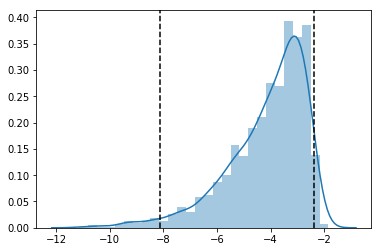

In [6]:
import seaborn as sns
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

mag = -2.5*np.log10(Datacube.Tab_SE["FLUX_AUTO"])
mag_no_nan = pd.Series(-2.5*np.log10(Datacube.Tab_SE["FLUX_AUTO"])).dropna()
mag_cut = (np.percentile(mag_no_nan, 2.5), np.percentile(mag_no_nan, 97.5))

np.sum((mag_no_nan<mag_cut[1])&(mag_no_nan>mag_cut[0]))
sns.distplot(mag_no_nan)
plt.axvline(mag_cut[0],color='k',ls='--')
plt.axvline(mag_cut[1],color='k',ls='--')

p = np.percentile(Datacube.diff_centroids_c,50)
q = np.percentile(Datacube.diff_centroids_c,80)

In [7]:
Datacube.construct_control(snr_control=5, mag_per=(2.5,97.5),bootstraped=True)

Control Sample : n=1022
Bootsrap sample: 20
Bootsrap sample: 40
Bootsrap sample: 60
Bootsrap sample: 80
Bootsrap sample: 100


In [7]:
# #Control sample
# cut = Datacube.Tab_SE["NUMBER"][(mag>mag_cut[0])&(mag<mag_cut[1])]
# Num_c = np.setdiff1d(Datacube.Tab_SE["NUMBER"][Datacube.CC_SNR_max<3], 1+np.where(np.isnan(Datacube.diff_centroids))[0])
# Num_c = np.intersect1d(Num_c, cut)
# ind_c = Num_c-1
# diff_angles_c = Datacube.diff_angles[ind_c]
# diff_centroids_c = Datacube.diff_centroids[ind_c]
# dist_clus_cens_c = Datacube.dist_clus_cens[ind_c]
# Num_c.shape

(335,)

In [12]:
# from astropy.stats import bootstrap
# #Bootstrap control sample index
# Num_c_bp = bootstrap(Num_c,bootnum=100, samples=None).astype("int")
# print(Num_c_bp.shape)

# # Bootstrap control sample
# diff_angles_c_bp = np.zeros_like(Num_c_bp)
# diff_centroids_c_bp = np.zeros_like(Num_c_bp)
# dist_clus_cens_c_bp = np.zeros_like(Num_c_bp)
# for i in range(100):
#     if np.mod(i+1,20)==0: print("Bootsrap sample: %d"%(i+1))
#     diff_angles_c_bp[i] = Datacube.diff_angles[Num_c_bp[i]-1]
#     diff_centroids_c_bp[i] = Datacube.diff_centroids[Num_c_bp[i]-1]
#     dist_clus_cens_c_bp[i] = Datacube.dist_clus_cens[Num_c_bp[i]-1]

(100, 335)
Bootsrap sample: 20
Bootsrap sample: 40
Bootsrap sample: 60
Bootsrap sample: 80
Bootsrap sample: 100


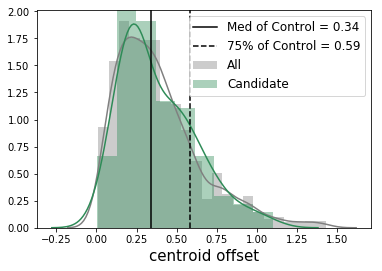

In [22]:
#ISO2
draw_centroid_offset(Datacube.diff_centroids_v, Datacube.diff_centroids_c)

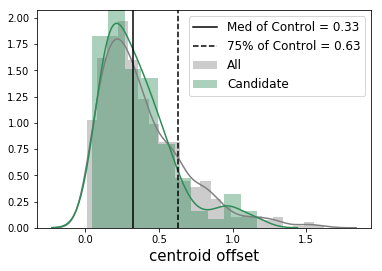

In [9]:
#APER iter
draw_centroid_offset(Datacube.diff_centroids_v, Datacube.diff_centroids_c)

51
21


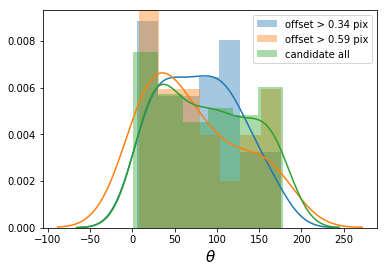

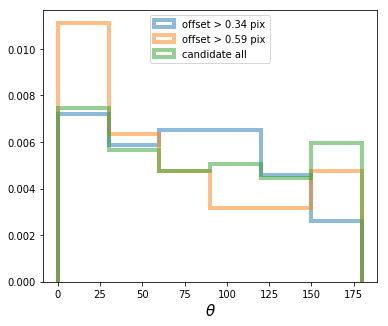

In [30]:
#ISO2
draw_angle_candidate(Datacube.diff_angles_v, Datacube.diff_centroids_v, Datacube.diff_centroids_c, crit=[0.5, 0.8], b=7)

52
12


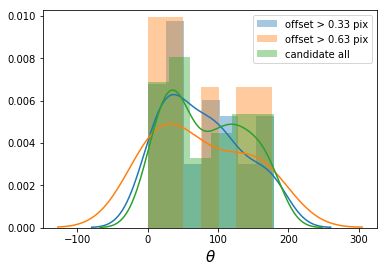

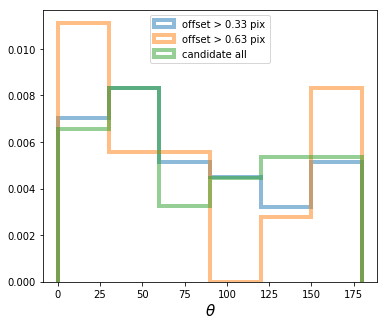

In [11]:
#Aper ite
draw_angle_candidate(Datacube.diff_angles_v, Datacube.diff_centroids_v, Datacube.diff_centroids_c, crit=[0.5, 0.8], b=7)

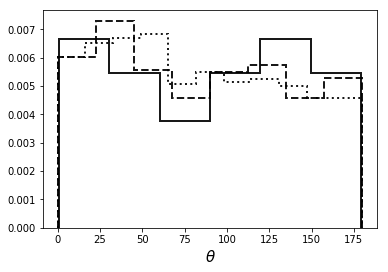

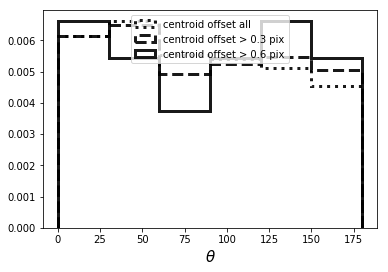

In [31]:
#ISO
plt.figure(figsize=(6,4))
draw_angle_control(Datacube.diff_angles_c,Datacube.diff_centroids_c, crit=[0.5,0.8])

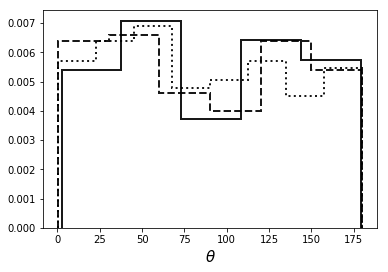

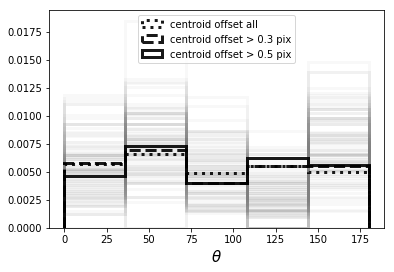

In [14]:
#Aperture
# for k in range(100):
#     sns.distplot(diff_angles_c_bp[k][diff_centroids_c_bp[k]>0],bins=7,color="gray",kde=False,norm_hist=True,
#                  kde_kws={"alpha":0.05},hist_kws={"histtype":"step","alpha":0.1})

plt.figure(figsize=(6,4))
draw_angle_control(Datacube.diff_angles_c,Datacube.diff_centroids_c, crit=[0.5,0.8])

for k in range(100):
    _, bins = np.histogram(diff_angles_c_bp[k][diff_centroids_c_bp[k]>0],bins=np.linspace(0,180,6))
    plt.hist(diff_angles_c_bp[k][diff_centroids_c_bp[k]>0], bins=bins,
             color="gray",normed=True,histtype="step",linewidth=3,alpha=0.05)

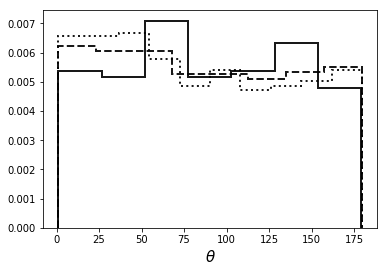

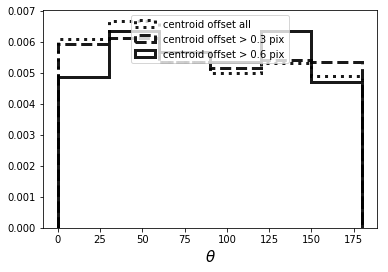

In [12]:
#Aper iter
sns.distplot(Datacube.diff_angles_c, color="k", kde=False, norm_hist=True,
             kde_kws={"alpha":0.9},hist_kws={"histtype":"step","linewidth":2,"linestyle":':',"alpha":0.9})
sns.distplot(Datacube.diff_angles_c[Datacube.diff_centroids_c>p],color="k",kde=False,norm_hist=True,
             kde_kws={"alpha":0.9},hist_kws={"histtype":"step","linewidth":2,"linestyle":'--',"alpha":0.9})
sns.distplot(Datacube.diff_angles_c[Datacube.diff_centroids_c>q],color="k",kde=False,norm_hist=True,
             kde_kws={"alpha":0.9},hist_kws={"histtype":"step","linewidth":2,"alpha":0.9})
plt.xlabel("$\\theta$",fontsize=15)

plt.figure(figsize=(6,4))
plt.hist(Datacube.diff_angles_c, bins=np.linspace(0,180,7), color="k",
         normed=True,histtype="step",linestyle=":",linewidth=3,alpha=0.9, label="centroid offset all")    
plt.hist(Datacube.diff_angles_c[Datacube.diff_centroids_c>p], bins=np.linspace(0,180,7), color="k",
         normed=True,histtype="step",linestyle="--",linewidth=3,alpha=0.9, label="centroid offset > %.1f pix"%p)    
plt.hist(Datacube.diff_angles_c[Datacube.diff_centroids_c>q], bins=np.linspace(0,180,7), color="k",
         normed=True,histtype="step",linewidth=3,alpha=0.9,label="centroid offset > %.1f pix"%q)  
plt.xlabel("$\\theta$",fontsize=15)
plt.legend(loc=9,fontsize=10)

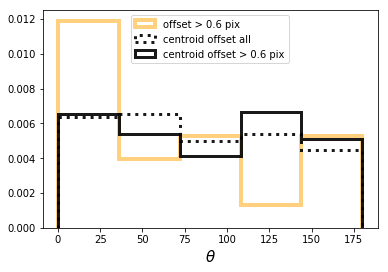

In [25]:
# ISO
plt.figure(figsize=(7,6))
draw_angle_compare(Datacube.diff_angles_v, Datacube.diff_centroids_v, 
                   Datacube.diff_angles_c, Datacube.diff_centroids_c, crit=0.8, b=7)

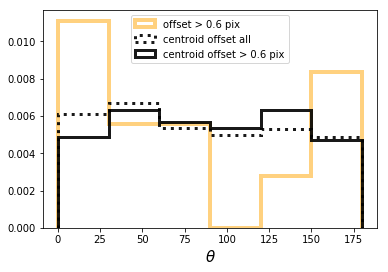

In [14]:
# APER iter
plt.figure(figsize=(7,6))
draw_angle_compare(Datacube.diff_angles_v, Datacube.diff_centroids_v, 
                   Datacube.diff_angles_c, Datacube.diff_centroids_c, crit=0.8, b=7)

In [26]:
from scipy.stats import kstest,ks_2samp,norm, anderson_ksamp

#ISO
print(ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>p], Datacube.diff_angles_c[Datacube.diff_centroids_c>p]))
print(ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c[Datacube.diff_centroids_c>q]))
print(ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c))

print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c[Datacube.diff_centroids_c>q]]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c]))

Ks_2sampResult(statistic=0.13002250080360012, pvalue=0.39103040505431474)
Ks_2sampResult(statistic=0.2295918367346939, pvalue=0.23603156169069794)
Ks_2sampResult(statistic=0.21260418189793828, pvalue=0.27578941444553134)
Anderson_ksampResult(statistic=0.41336466245774384, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.22744284552699026)
Anderson_ksampResult(statistic=0.12838241807543488, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.30473552407281274)


In [20]:
from scipy.stats import kstest,ks_2samp,norm, anderson_ksamp
#APER
print(ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>p], Datacube.diff_angles_c[Datacube.diff_centroids_c>p]))
print(ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c[Datacube.diff_centroids_c>q]))
print(ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c))

print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c[Datacube.diff_centroids_c>q]]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c]))

Ks_2sampResult(statistic=0.14393853801830303, pvalue=0.34912713164738873)
Ks_2sampResult(statistic=0.2761904761904762, pvalue=0.14146325155337788)
Ks_2sampResult(statistic=0.23283582089552235, pvalue=0.22451835632030226)
Anderson_ksampResult(statistic=0.9254964866821216, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.1358433180466718)
Anderson_ksampResult(statistic=0.2401112691844176, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.2715810520540364)


In [16]:
from scipy.stats import kstest,ks_2samp,norm, anderson_ksamp
#APER iter
print(ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>p], Datacube.diff_angles_c[Datacube.diff_centroids_c>p]))
print(ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c[Datacube.diff_centroids_c>q]))
print(ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c))

print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c[Datacube.diff_centroids_c>q]]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c]))

Ks_2sampResult(statistic=0.13999698931205784, pvalue=0.29112606999671853)
Ks_2sampResult(statistic=0.25609756097560976, pvalue=0.39084432239891337)
Ks_2sampResult(statistic=0.2353228962818004, pvalue=0.4711204549718856)
Anderson_ksampResult(statistic=1.0724633548721645, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.117454212358119)
Anderson_ksampResult(statistic=1.1834449247525267, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.10531268853633284)


In [17]:
import pandas as pd
df = pd.DataFrame({"diff_angle":np.concatenate([Datacube.diff_angles_v, Datacube.diff_angles_c]),
                 "diff_centroid":np.concatenate([Datacube.diff_centroids_v, Datacube.diff_centroids_c]),
                 "type":np.concatenate([['v']*len(Datacube.diff_centroids_v), ['c']*len(Datacube.diff_centroids_c)])})
df.to_csv('./A2465C/centroid_analysis_A2465C_aper2.csv',sep=',',index=None)